In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/31eegchannel5participants/datasets/Channels.dat
/kaggle/input/31eegchannel5participants/datasets/Channels.dat.docx
/kaggle/input/31eegchannel5participants/datasets/Participant 4/Figs for spectra/Backgr_int_0.6.dat
/kaggle/input/31eegchannel5participants/datasets/Participant 4/Figs for spectra/Backgr_int_0.5.dat
/kaggle/input/31eegchannel5participants/datasets/Participant 4/Figs for spectra/Backgr_int_0.9.dat
/kaggle/input/31eegchannel5participants/datasets/Participant 4/Figs for spectra/Backgr_int_0.2.dat
/kaggle/input/31eegchannel5participants/datasets/Participant 4/Figs for spectra/Backgr_int_0.7.dat
/kaggle/input/31eegchannel5participants/datasets/Participant 4/Figs for spectra/Backgr_int_0.8.dat
/kaggle/input/31eegchannel5participants/datasets/Participant 4/Figs for spectra/Backgr_int_0.3.dat
/kaggle/input/31eegchannel5participants/datasets/Participant 4/Figs for spectra/Backgr_int_0.4.dat
/kaggle/input/31eegchannel5participants/datasets/Participant 4/Figs for spectra

In [2]:
!nvidia-smi

Tue Sep  2 11:49:00 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   42C    P8              9W /   70W |       1MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
!pip install --upgrade pip

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 23.0 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2


In [4]:
import tensorflow as tf
print(tf.__version__)

2025-09-02 11:49:11.121395: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1756813751.475636      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1756813751.578692      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


2.18.0


In [5]:
!pip install GPUtil

  Preparing metadata (setup.py) ... done
  DEPRECATION: Building 'GPUtil' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'GPUtil'. Discussion can be found at https://github.com/pypa/pip/issues/6334
  Created wheel for GPUtil: filename=GPUtil-1.4.0-py3-none-any.whl size=7392 sha256=09923afca2e1472cb411badf046c087f079f6ce83e3c789f5a738e5d8f920266
  Stored in directory: /root/.cache/pip/wheels/2b/4d/8f/55fb4f7b9b591891e8d3f72977c4ec6c7763b39c19f0861595
Successfully built GPUtil


In [6]:
import psutil
import GPUtil
import platform

def get_system_info():
    # RAM usage and capacity
    ram = psutil.virtual_memory()
    ram_usage = ram.percent
    ram_capacity = ram.total / (1024 ** 3)  # Convert to GB

    # CPU name
    cpu_name = platform.processor()

    # GPU/TPU name
    try:
        gpus = GPUtil.getGPUs()
        gpu_name = gpus[0].name
    except Exception as e:
        gpu_name = None

    return ram_usage, ram_capacity, cpu_name, gpu_name

ram_usage, ram_capacity, cpu_name, gpu_name = get_system_info()

print(f"RAM Usage: {ram_usage}%")
print(f"RAM Capacity: {ram_capacity:.2f} GB")
print(f"CPU Name: {cpu_name}")
if gpu_name:
    print(f"GPU Name: {gpu_name}")
else:
    print("GPU information not available.")

RAM Usage: 4.3%
RAM Capacity: 31.35 GB
CPU Name: x86_64
GPU Name: Tesla T4


In [7]:
import psutil
import platform
import os

def get_system_info():
    # RAM usage and capacity
    ram = psutil.virtual_memory()
    ram_usage = ram.percent
    ram_capacity = ram.total / (1024 ** 3)  # GB

    # CPU name
    cpu_name = platform.processor()

    # GPU info (optional, for completeness)
    try:
        import GPUtil
        gpus = GPUtil.getGPUs()
        gpu_name = gpus[0].name if gpus else None
    except:
        gpu_name = None

    # TPU info (Kaggle/Colab)
    try:
        tpu_name = os.environ.get('COLAB_TPU_ADDR', None)
        if tpu_name:
            tpu_name = f"TPU at {tpu_name}"
    except:
        tpu_name = None

    return ram_usage, ram_capacity, cpu_name, gpu_name, tpu_name

ram_usage, ram_capacity, cpu_name, gpu_name, tpu_name = get_system_info()

print(f"RAM Usage: {ram_usage}%")
print(f"RAM Capacity: {ram_capacity:.2f} GB")
print(f"CPU Name: {cpu_name}")
print(f"GPU Name: {gpu_name}" if gpu_name else "GPU information not available.")
print(f"TPU Name: {tpu_name}" if tpu_name else "TPU information not available.")


RAM Usage: 4.3%
RAM Capacity: 31.35 GB
CPU Name: x86_64
GPU Name: Tesla T4
TPU information not available.


In [8]:
import torch

# Check if CUDA (GPU support) is available
if torch.cuda.is_available():
    # Get the number of available GPUs
    num_gpus = torch.cuda.device_count()
    
    print(f"Number of available GPUs: {num_gpus}")
    
    # Print the IDs of each GPU
    for gpu_id in range(num_gpus):
        gpu_name = torch.cuda.get_device_name(gpu_id)
        print(f"GPU {gpu_id}: {gpu_name}")
else:
    print("No GPU devices available.")

Number of available GPUs: 2
GPU 0: Tesla T4
GPU 1: Tesla T4


In [9]:
import psutil
import torch

# RAM
ram_total_gb = psutil.virtual_memory().total / (1024 ** 3)
print(f"Total RAM: {ram_total_gb:.2f} GB")

# GPU
if torch.cuda.is_available():
    gpu = torch.cuda.get_device_properties(0)
    print(f"GPU: {gpu.name}, {gpu.total_memory / (1024**3):.2f} GB")
else:
    print("No GPU detected.")

# TPU (if enabled)
import os
tpu_addr = os.environ.get('COLAB_TPU_ADDR', None)
print(f"TPU: {'Available at ' + tpu_addr if tpu_addr else 'Not available'}")


Total RAM: 31.35 GB
GPU: Tesla T4, 14.74 GB
TPU: Not available


In [10]:
# Enhanced EEG Analysis with Traditional ML Benchmarking and Complete Evaluation
import numpy as np
import pandas as pd
import os
from scipy import signal
import time
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (classification_report, confusion_matrix, 
                           cohen_kappa_score, roc_curve, auc, f1_score)
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.python.client import device_lib
import warnings
warnings.filterwarnings('ignore')


Processing: Mona Lisa - delta
Pre-Process time = 50.29 seconds

Running Traditional ML Models...

Training Random Forest...

Training -end 3.2340121269226074...


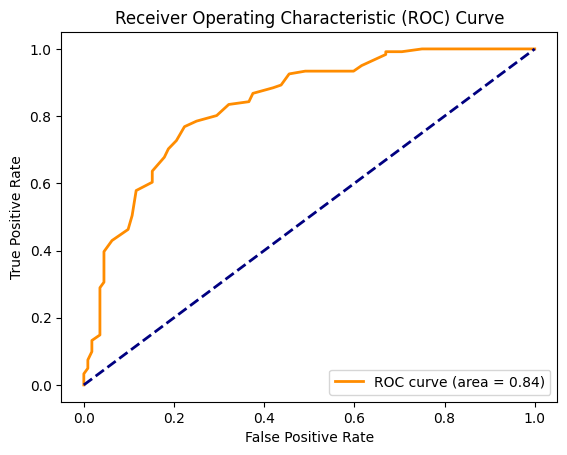


Training SVM (RBF)...

Training -end 54.1627254486084...


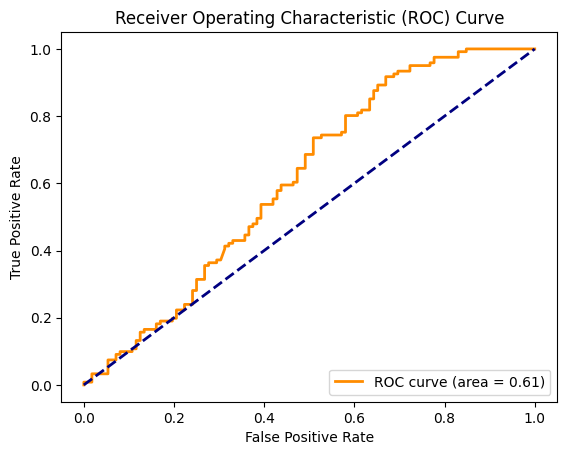


Training SVM (Linear)...

Training -end 24.69003462791443...


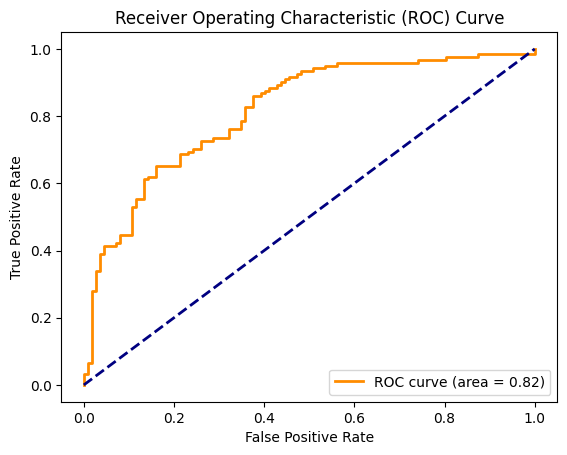


Training Logistic Regression...

Training -end 21.759172439575195...


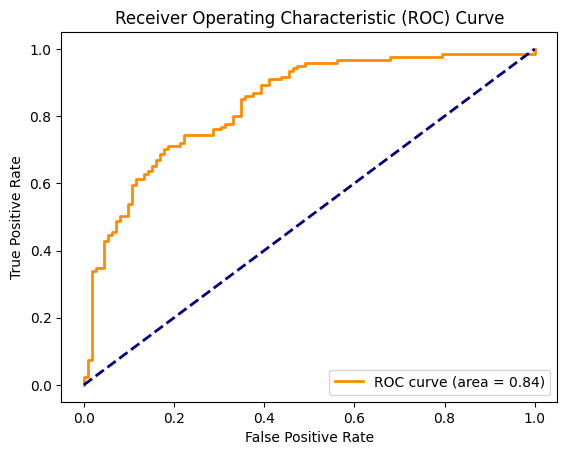


Training Decision Tree...

Training -end 14.009869575500488...


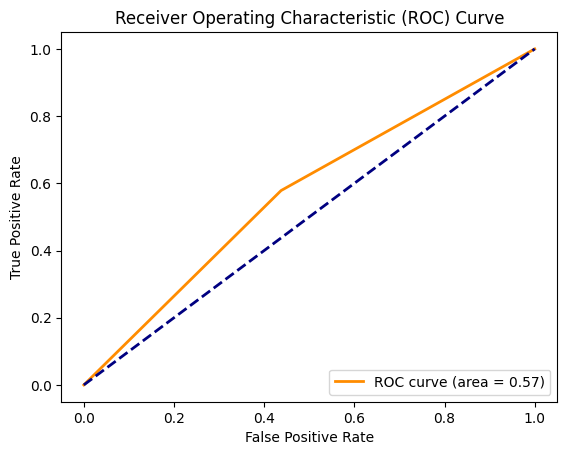


Training KNN...


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec


Training -end 0.7211880683898926...


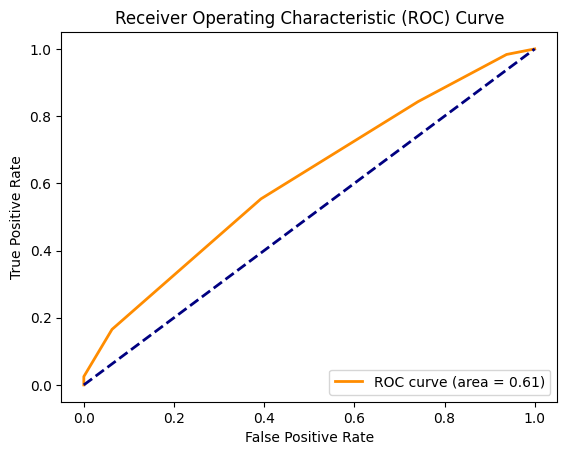


Training Naive Bayes...

Training -end 0.7888360023498535...


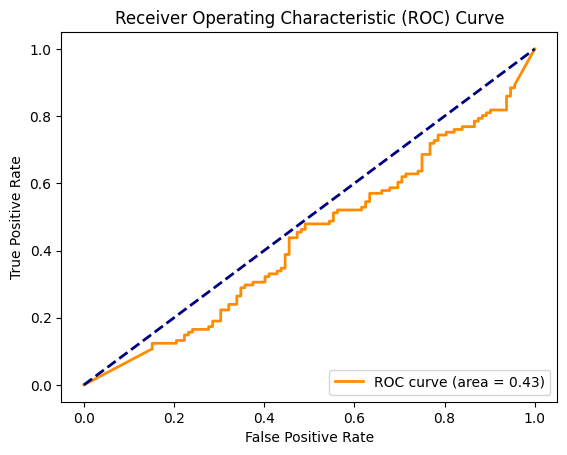


Running Deep Learning Model...


I0000 00:00:1756813984.225740      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1756813984.226405      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Epoch 1/200


I0000 00:00:1756813994.865221     110 service.cc:148] XLA service 0x7a4990011840 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1756813994.866679     110 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1756813994.866701     110 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1756813995.791406     110 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1756813998.884449     110 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


136/136 - 17s - 128ms/step - accuracy: 0.4949 - loss: 0.7798 - val_accuracy: 0.5431 - val_loss: 0.7099
Epoch 2/200
136/136 - 1s - 11ms/step - accuracy: 0.5106 - loss: 0.7057 - val_accuracy: 0.4698 - val_loss: 0.7065
Epoch 3/200
136/136 - 1s - 11ms/step - accuracy: 0.5447 - loss: 0.6933 - val_accuracy: 0.5302 - val_loss: 0.6967
Epoch 4/200
136/136 - 1s - 11ms/step - accuracy: 0.5346 - loss: 0.6950 - val_accuracy: 0.5302 - val_loss: 0.6964
Epoch 5/200
136/136 - 1s - 11ms/step - accuracy: 0.5281 - loss: 0.6940 - val_accuracy: 0.4957 - val_loss: 0.6943
Epoch 6/200
136/136 - 1s - 11ms/step - accuracy: 0.5502 - loss: 0.6876 - val_accuracy: 0.4655 - val_loss: 0.7065
Epoch 7/200
136/136 - 1s - 11ms/step - accuracy: 0.5456 - loss: 0.6877 - val_accuracy: 0.4784 - val_loss: 0.7049
Epoch 8/200
136/136 - 1s - 11ms/step - accuracy: 0.5484 - loss: 0.6851 - val_accuracy: 0.5043 - val_loss: 0.7126
Epoch 9/200
136/136 - 1s - 11ms/step - accuracy: 0.5548 - loss: 0.6909 - val_accuracy: 0.4655 - val_loss: 

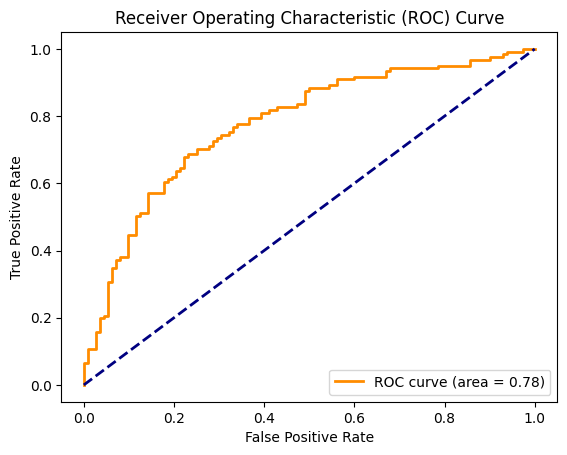

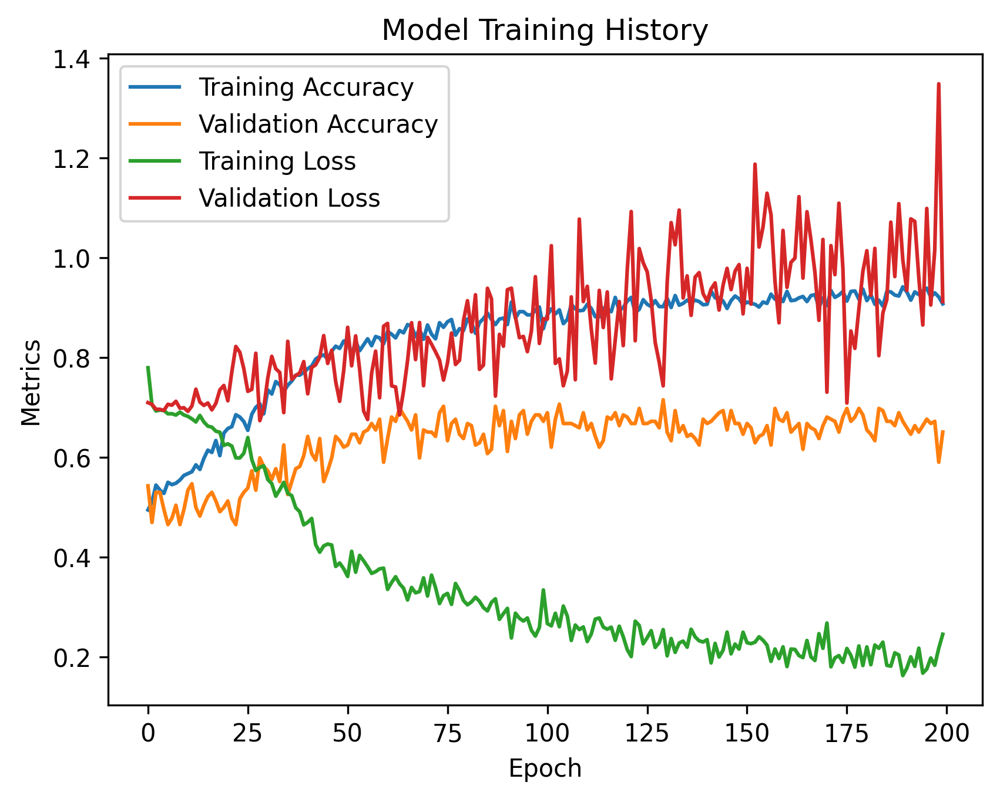


Processing: Mona Lisa - theta
Pre-Process time = 47.36 seconds

Running Traditional ML Models...

Training Random Forest...

Training -end 3.283703565597534...


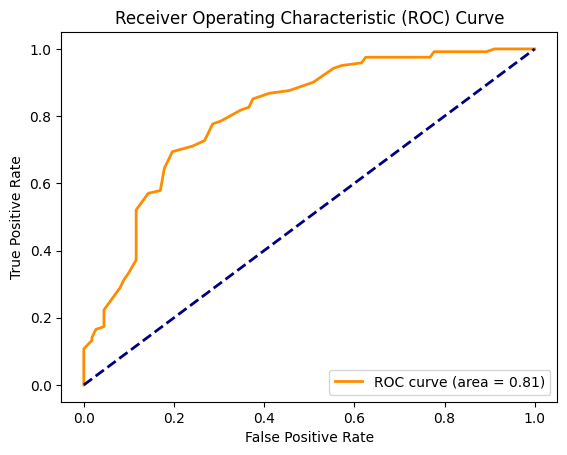


Training SVM (RBF)...

Training -end 53.776668071746826...


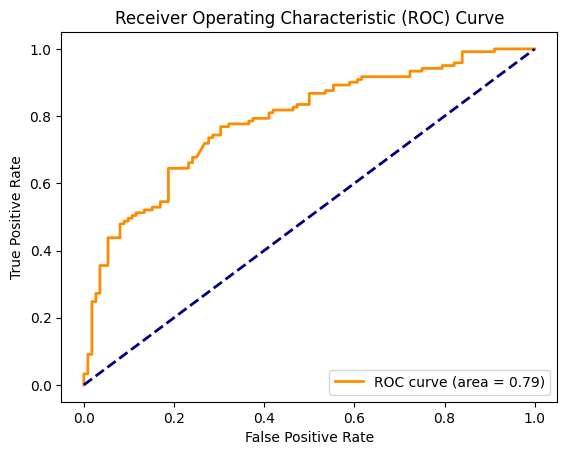


Training SVM (Linear)...

Training -end 21.26460909843445...


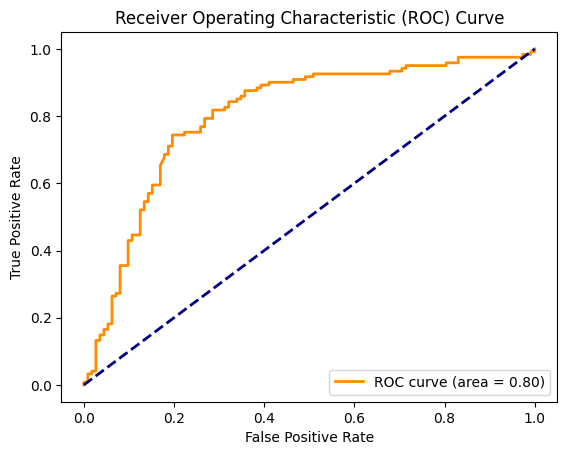


Training Logistic Regression...

Training -end 14.153494596481323...


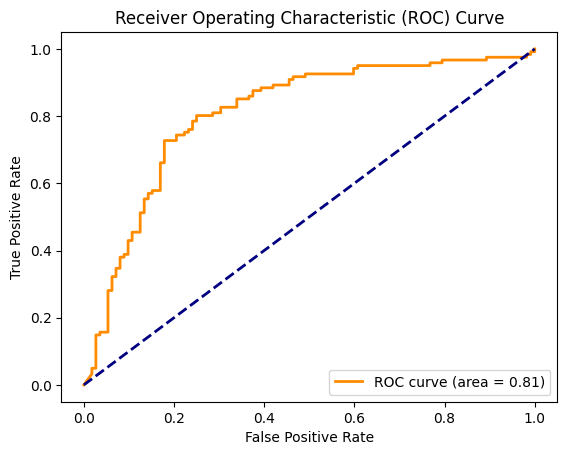


Training Decision Tree...

Training -end 15.849847555160522...


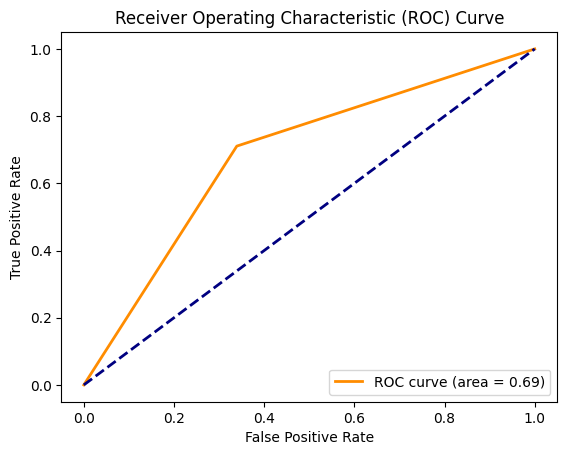


Training KNN...


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec


Training -end 0.6701521873474121...


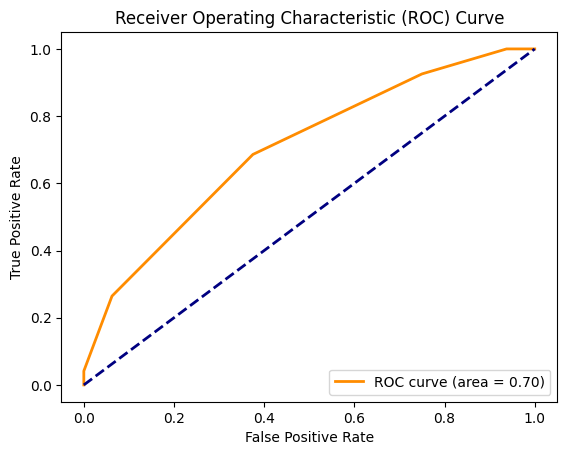


Training Naive Bayes...

Training -end 0.6789658069610596...


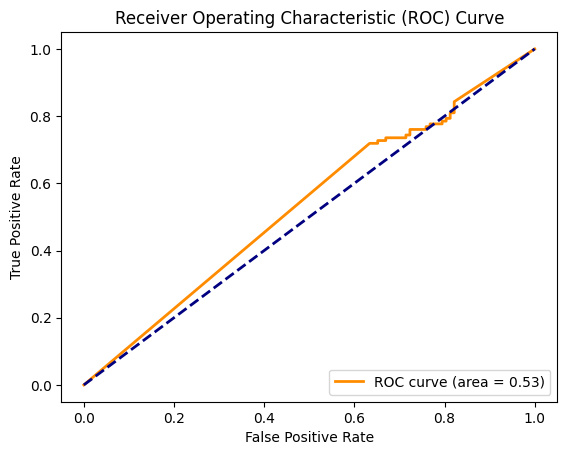


Running Deep Learning Model...
Epoch 1/200
136/136 - 14s - 105ms/step - accuracy: 0.5161 - loss: 0.7158 - val_accuracy: 0.5259 - val_loss: 0.6880
Epoch 2/200
136/136 - 1s - 11ms/step - accuracy: 0.5106 - loss: 0.6980 - val_accuracy: 0.5517 - val_loss: 0.6882
Epoch 3/200
136/136 - 1s - 11ms/step - accuracy: 0.5346 - loss: 0.6896 - val_accuracy: 0.4957 - val_loss: 0.7072
Epoch 4/200
136/136 - 1s - 11ms/step - accuracy: 0.5410 - loss: 0.6929 - val_accuracy: 0.4698 - val_loss: 0.7071
Epoch 5/200
136/136 - 1s - 11ms/step - accuracy: 0.5604 - loss: 0.6882 - val_accuracy: 0.5517 - val_loss: 0.7019
Epoch 6/200
136/136 - 1s - 11ms/step - accuracy: 0.5512 - loss: 0.6881 - val_accuracy: 0.4828 - val_loss: 0.7094
Epoch 7/200
136/136 - 1s - 11ms/step - accuracy: 0.5724 - loss: 0.6874 - val_accuracy: 0.5043 - val_loss: 0.6946
Epoch 8/200
136/136 - 1s - 11ms/step - accuracy: 0.6000 - loss: 0.6769 - val_accuracy: 0.4784 - val_loss: 0.7375
Epoch 9/200
136/136 - 1s - 11ms/step - accuracy: 0.6009 - loss

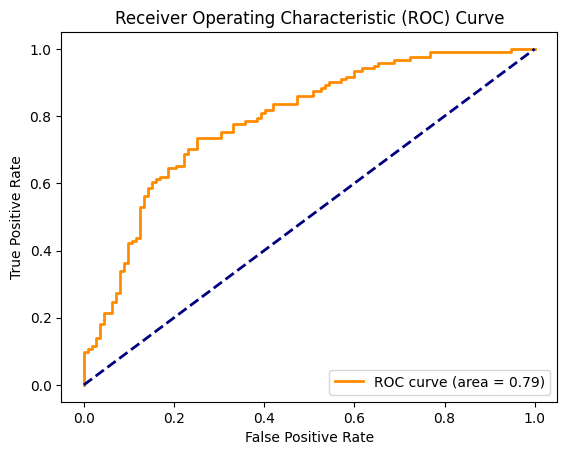

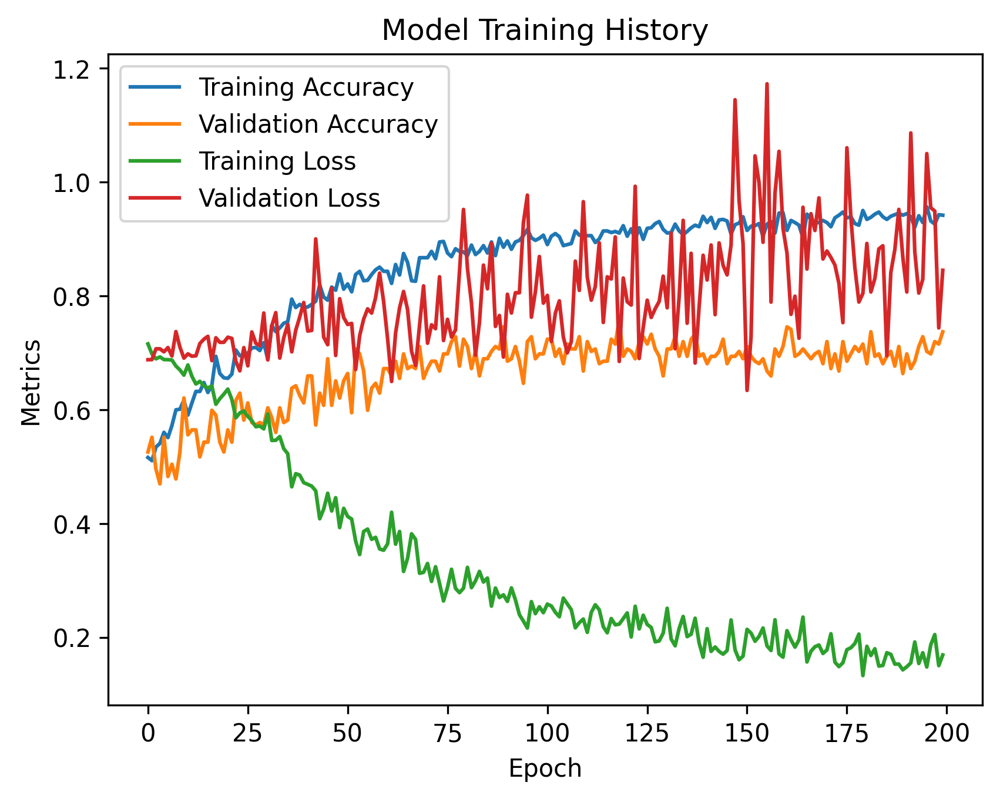


Processing: Mona Lisa - alpha
Pre-Process time = 46.94 seconds

Running Traditional ML Models...

Training Random Forest...

Training -end 3.143345832824707...


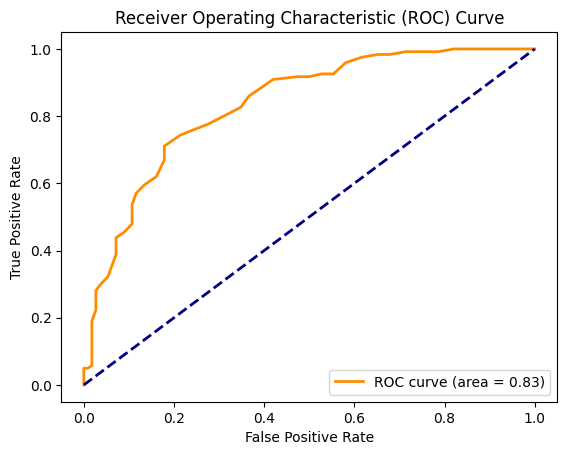


Training SVM (RBF)...

Training -end 53.155046463012695...


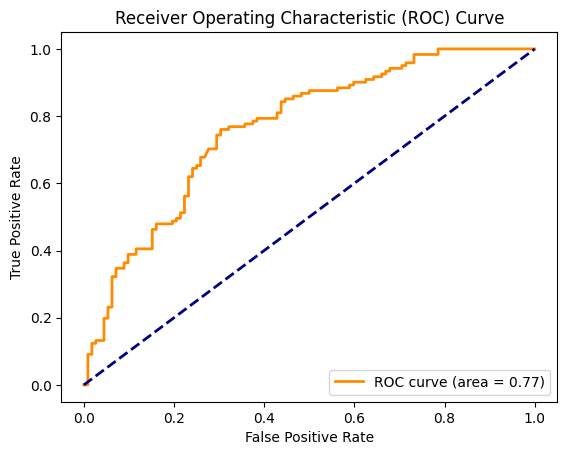


Training SVM (Linear)...

Training -end 20.93994140625...


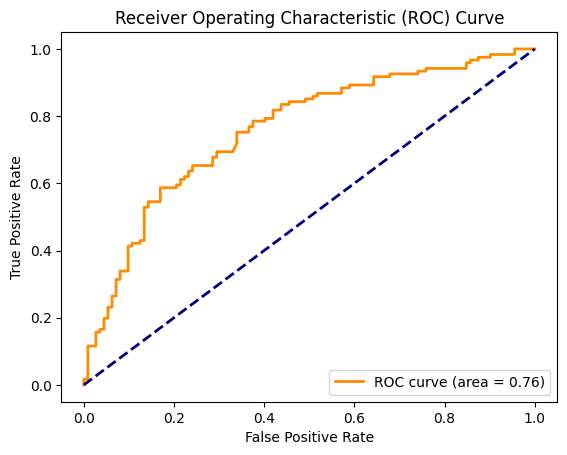


Training Logistic Regression...

Training -end 9.027908563613892...


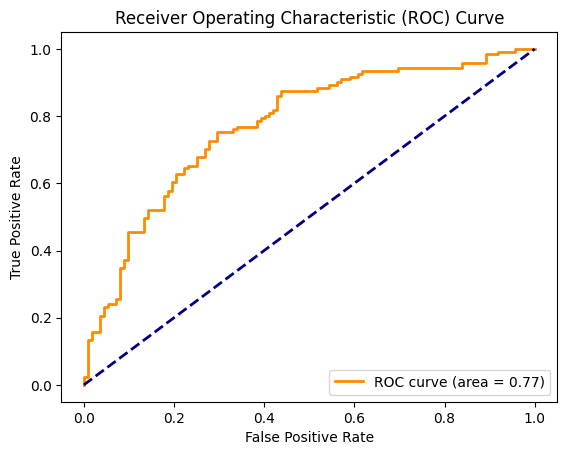


Training Decision Tree...

Training -end 14.2427237033844...


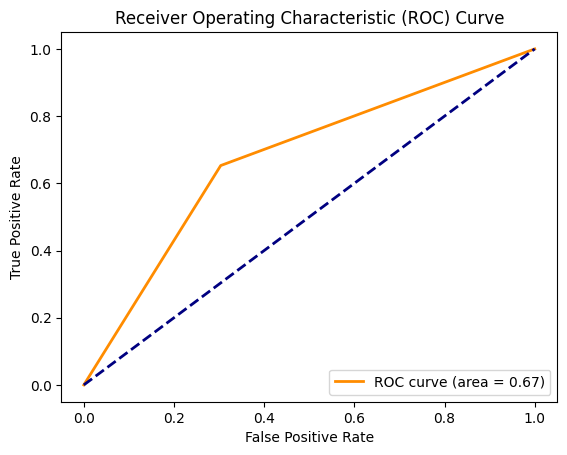


Training KNN...


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec


Training -end 0.6646256446838379...


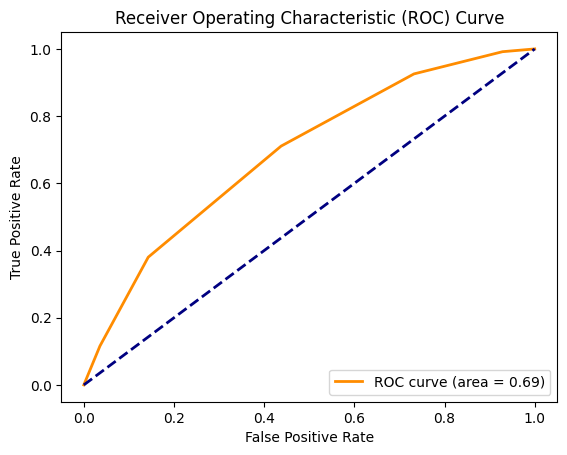


Training Naive Bayes...

Training -end 0.6618869304656982...


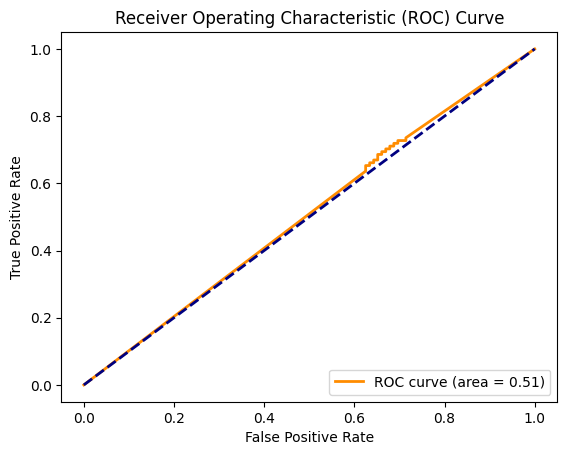


Running Deep Learning Model...
Epoch 1/200
136/136 - 14s - 105ms/step - accuracy: 0.5300 - loss: 0.7399 - val_accuracy: 0.5302 - val_loss: 0.6938
Epoch 2/200
136/136 - 1s - 11ms/step - accuracy: 0.5106 - loss: 0.7078 - val_accuracy: 0.5733 - val_loss: 0.6903
Epoch 3/200
136/136 - 1s - 11ms/step - accuracy: 0.4912 - loss: 0.7045 - val_accuracy: 0.5517 - val_loss: 0.6909
Epoch 4/200
136/136 - 1s - 11ms/step - accuracy: 0.5272 - loss: 0.6900 - val_accuracy: 0.5043 - val_loss: 0.7200
Epoch 5/200
136/136 - 1s - 11ms/step - accuracy: 0.5189 - loss: 0.6875 - val_accuracy: 0.4440 - val_loss: 0.7049
Epoch 6/200
136/136 - 1s - 11ms/step - accuracy: 0.5567 - loss: 0.6860 - val_accuracy: 0.5388 - val_loss: 0.6954
Epoch 7/200
136/136 - 1s - 11ms/step - accuracy: 0.6000 - loss: 0.6643 - val_accuracy: 0.5000 - val_loss: 0.7209
Epoch 8/200
136/136 - 1s - 11ms/step - accuracy: 0.5622 - loss: 0.6704 - val_accuracy: 0.4871 - val_loss: 0.7741
Epoch 9/200
136/136 - 1s - 11ms/step - accuracy: 0.5954 - loss

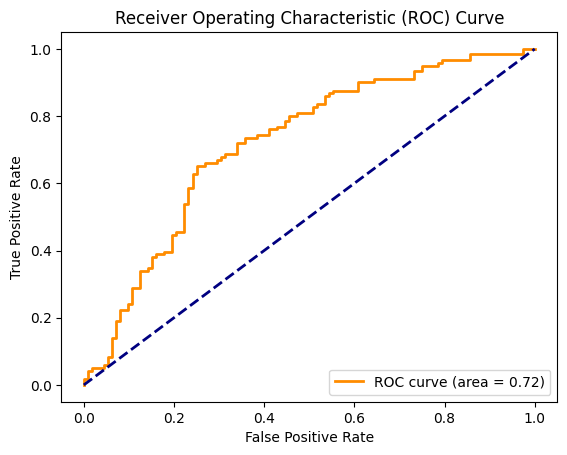

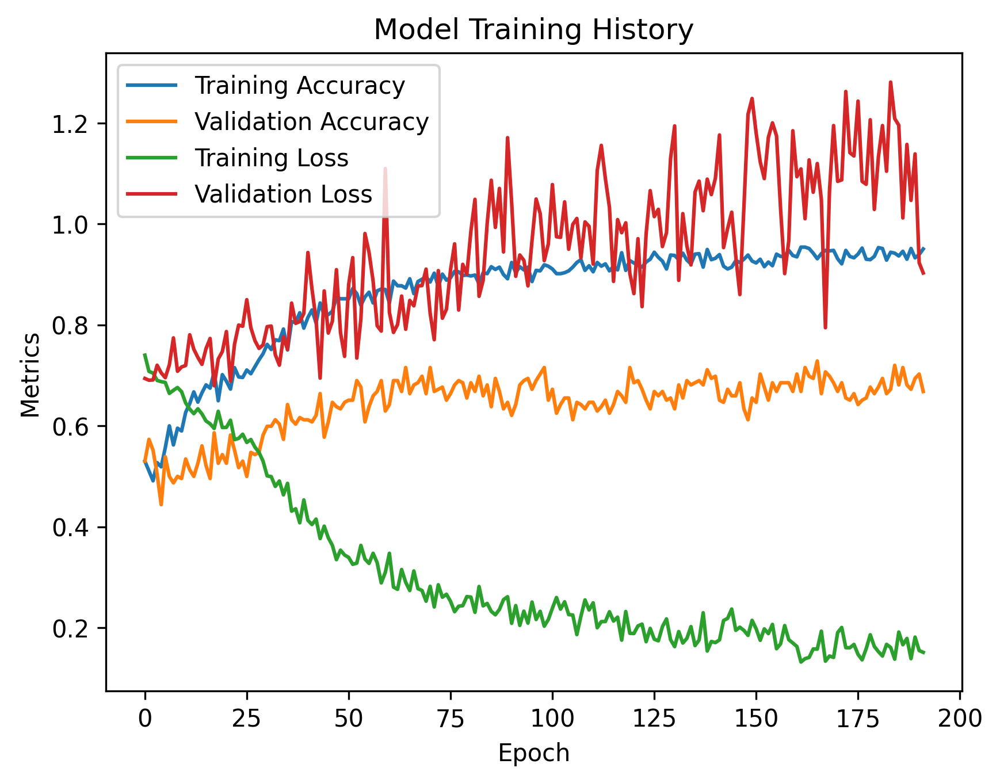


Processing: Mona Lisa - beta
Pre-Process time = 47.16 seconds

Running Traditional ML Models...

Training Random Forest...

Training -end 3.052593231201172...


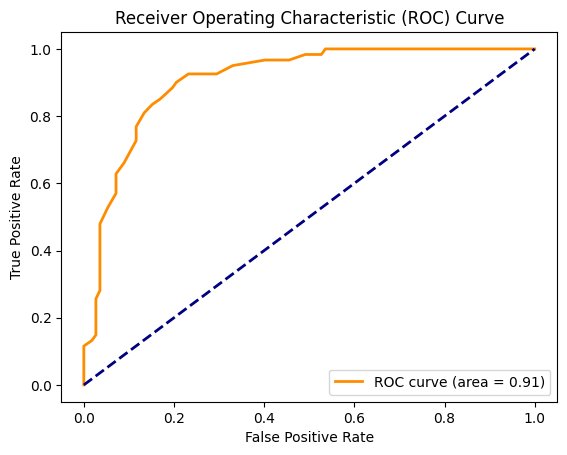


Training SVM (RBF)...

Training -end 51.7551703453064...


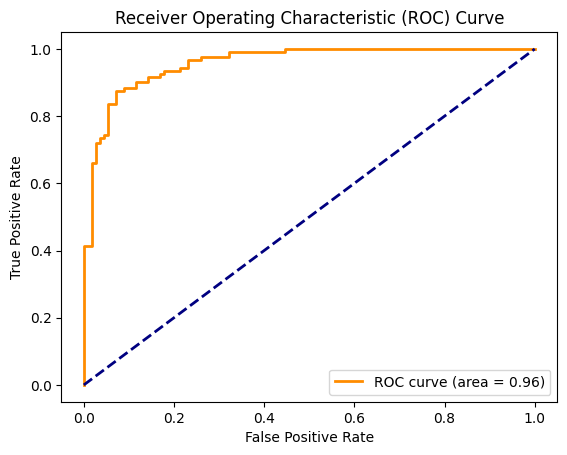


Training SVM (Linear)...

Training -end 25.3225314617157...


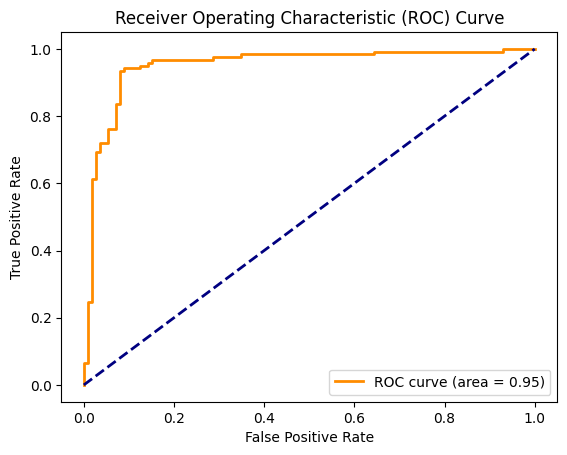


Training Logistic Regression...

Training -end 2.6621768474578857...


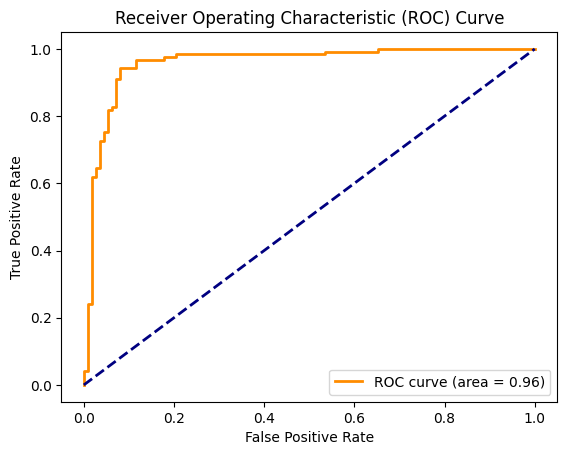


Training Decision Tree...

Training -end 12.369634866714478...


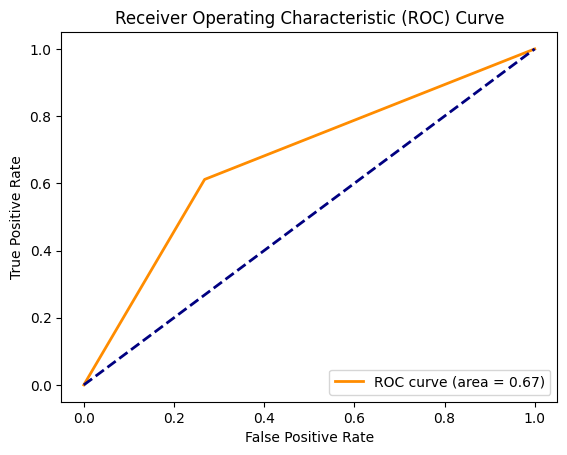


Training KNN...


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec


Training -end 0.6504671573638916...


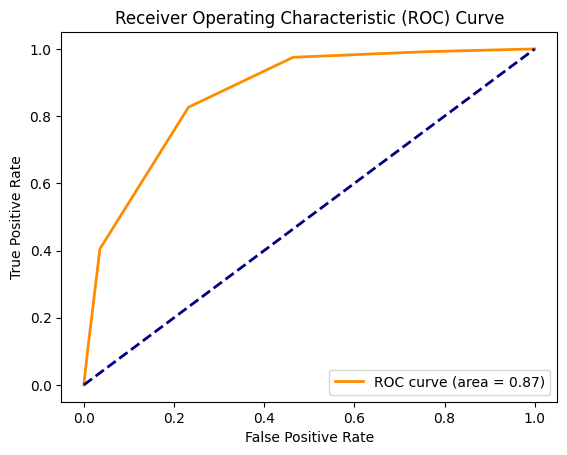


Training Naive Bayes...

Training -end 0.6680583953857422...


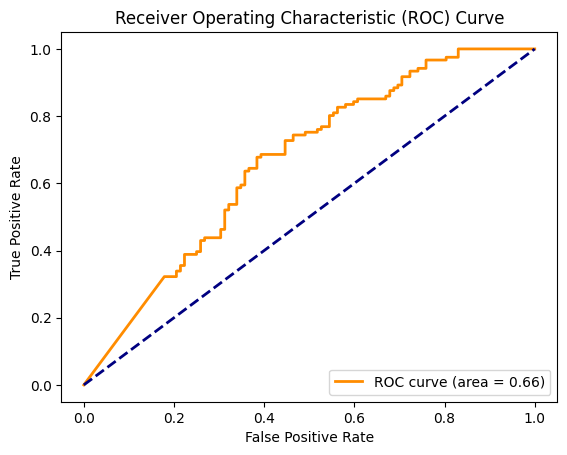


Running Deep Learning Model...
Epoch 1/200
136/136 - 14s - 106ms/step - accuracy: 0.5373 - loss: 0.7451 - val_accuracy: 0.5819 - val_loss: 0.6780
Epoch 2/200
136/136 - 1s - 11ms/step - accuracy: 0.6046 - loss: 0.6659 - val_accuracy: 0.5905 - val_loss: 0.6843
Epoch 3/200
136/136 - 1s - 11ms/step - accuracy: 0.6442 - loss: 0.6315 - val_accuracy: 0.5991 - val_loss: 0.6635
Epoch 4/200
136/136 - 1s - 11ms/step - accuracy: 0.6986 - loss: 0.5936 - val_accuracy: 0.6293 - val_loss: 0.6559
Epoch 5/200
136/136 - 1s - 11ms/step - accuracy: 0.7502 - loss: 0.5274 - val_accuracy: 0.7328 - val_loss: 0.5917
Epoch 6/200
136/136 - 1s - 11ms/step - accuracy: 0.7687 - loss: 0.4970 - val_accuracy: 0.7198 - val_loss: 0.5978
Epoch 7/200
136/136 - 1s - 11ms/step - accuracy: 0.7613 - loss: 0.4994 - val_accuracy: 0.7284 - val_loss: 0.5841
Epoch 8/200
136/136 - 1s - 11ms/step - accuracy: 0.8028 - loss: 0.4445 - val_accuracy: 0.7543 - val_loss: 0.5221
Epoch 9/200
136/136 - 1s - 11ms/step - accuracy: 0.7659 - loss

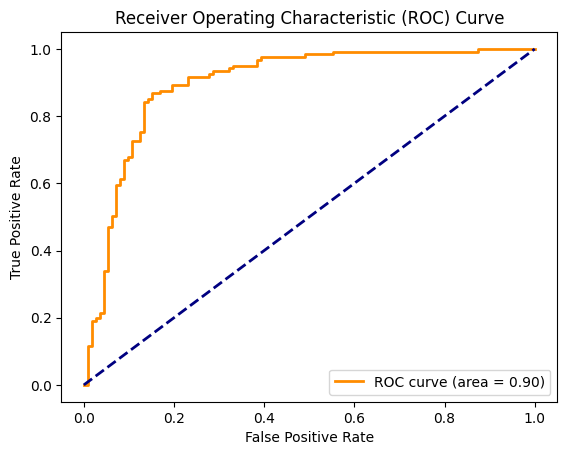

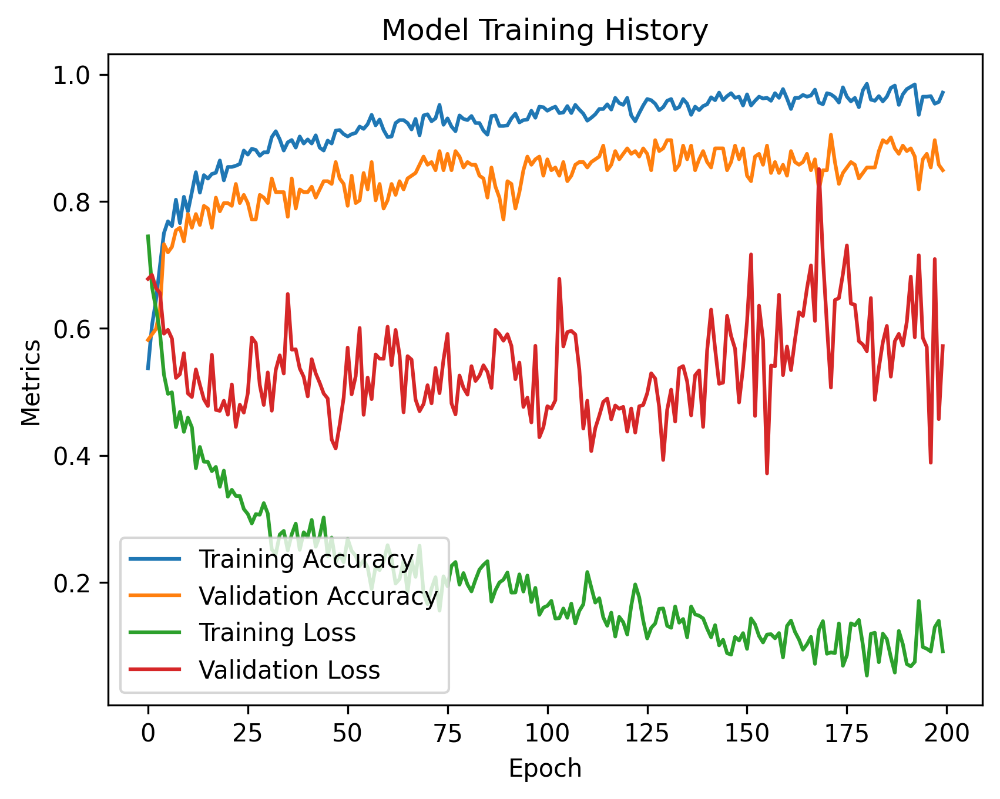


Processing: Mona Lisa - gamma
Pre-Process time = 46.39 seconds

Running Traditional ML Models...

Training Random Forest...

Training -end 2.927426815032959...


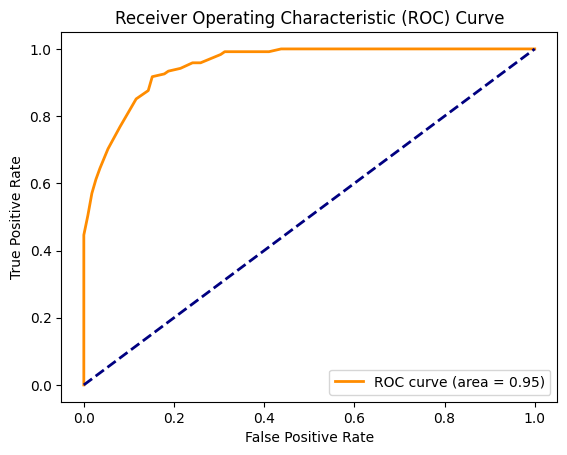


Training SVM (RBF)...

Training -end 49.60959434509277...


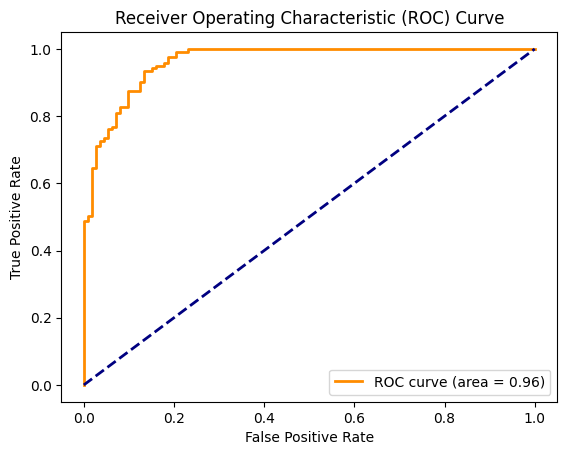


Training SVM (Linear)...

Training -end 20.333245515823364...


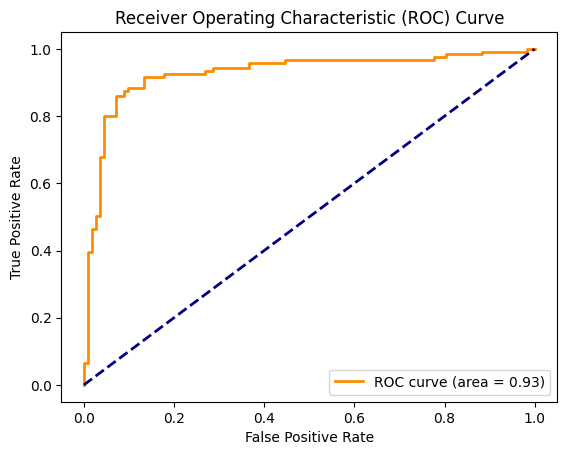


Training Logistic Regression...

Training -end 4.174935817718506...


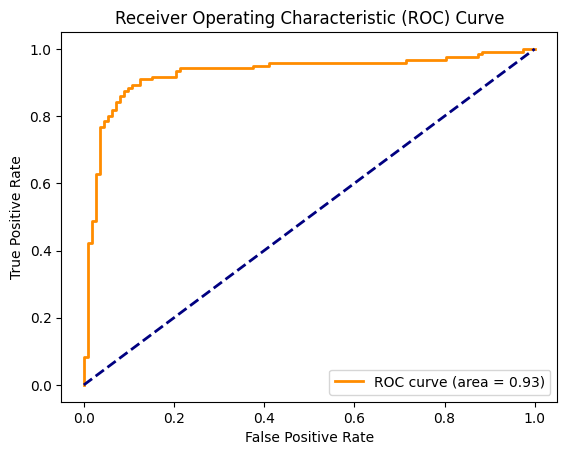


Training Decision Tree...

Training -end 12.345681428909302...


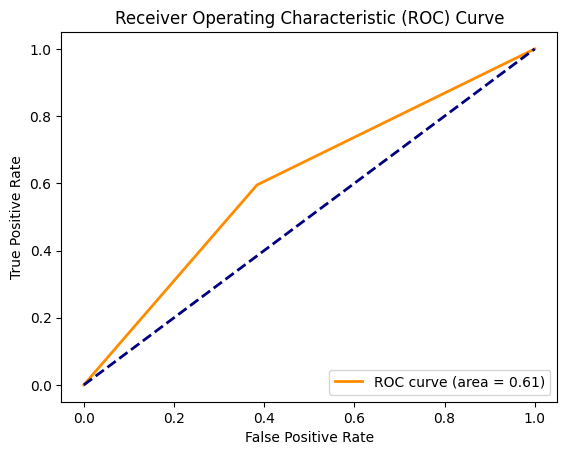


Training KNN...


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec


Training -end 0.7175521850585938...


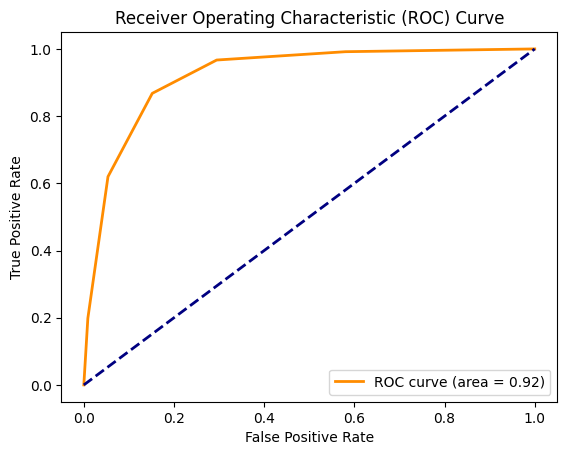


Training Naive Bayes...

Training -end 0.6492986679077148...


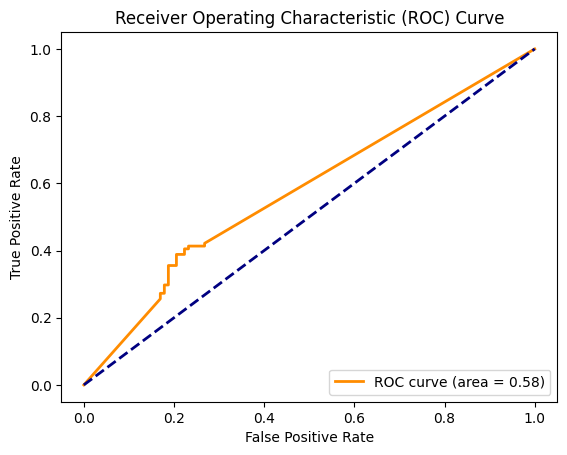


Running Deep Learning Model...
Epoch 1/200
136/136 - 14s - 106ms/step - accuracy: 0.5548 - loss: 0.7113 - val_accuracy: 0.5517 - val_loss: 0.6768
Epoch 2/200
136/136 - 1s - 11ms/step - accuracy: 0.6350 - loss: 0.6397 - val_accuracy: 0.6336 - val_loss: 0.6521
Epoch 3/200
136/136 - 1s - 11ms/step - accuracy: 0.7152 - loss: 0.5625 - val_accuracy: 0.7716 - val_loss: 0.5096
Epoch 4/200
136/136 - 1s - 11ms/step - accuracy: 0.7797 - loss: 0.4857 - val_accuracy: 0.7371 - val_loss: 0.4996
Epoch 5/200
136/136 - 1s - 11ms/step - accuracy: 0.8046 - loss: 0.4563 - val_accuracy: 0.8060 - val_loss: 0.4528
Epoch 6/200
136/136 - 1s - 11ms/step - accuracy: 0.8175 - loss: 0.4172 - val_accuracy: 0.7759 - val_loss: 0.5136
Epoch 7/200
136/136 - 1s - 11ms/step - accuracy: 0.8442 - loss: 0.3986 - val_accuracy: 0.7845 - val_loss: 0.4839
Epoch 8/200
136/136 - 1s - 11ms/step - accuracy: 0.8092 - loss: 0.4279 - val_accuracy: 0.7888 - val_loss: 0.4445
Epoch 9/200
136/136 - 1s - 11ms/step - accuracy: 0.8295 - loss

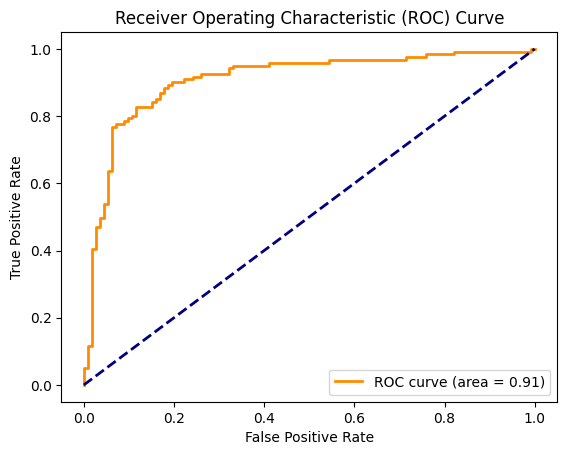

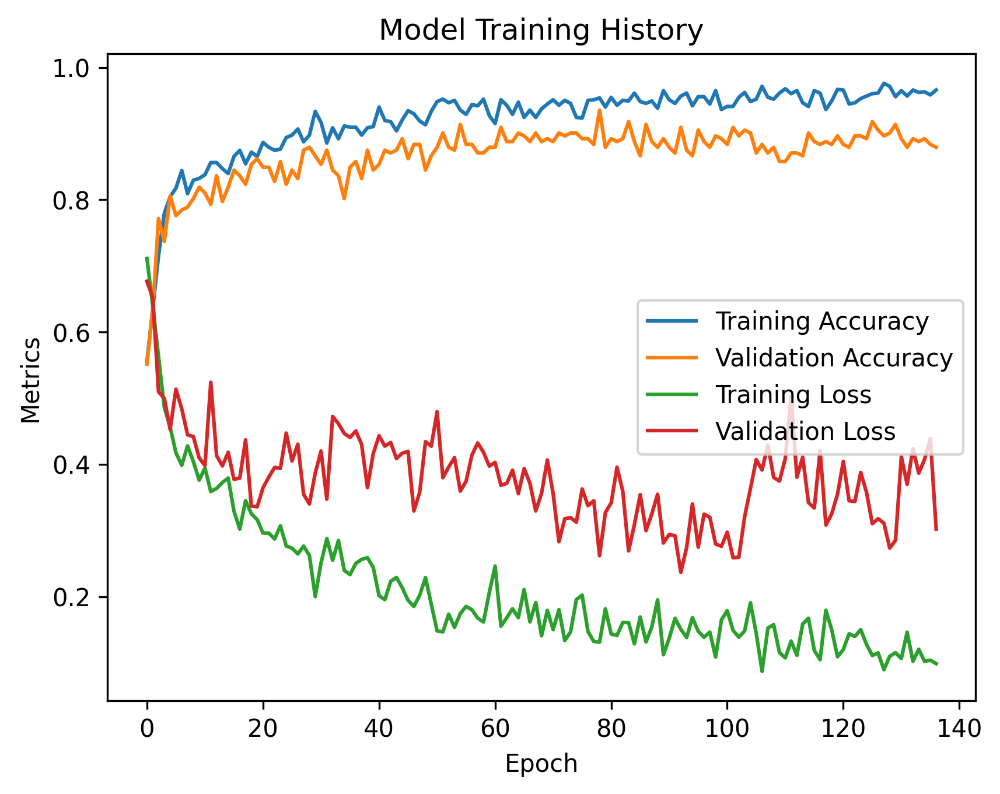


Processing: Necker cube - delta
Pre-Process time = 49.60 seconds

Running Traditional ML Models...

Training Random Forest...

Training -end 3.200849771499634...


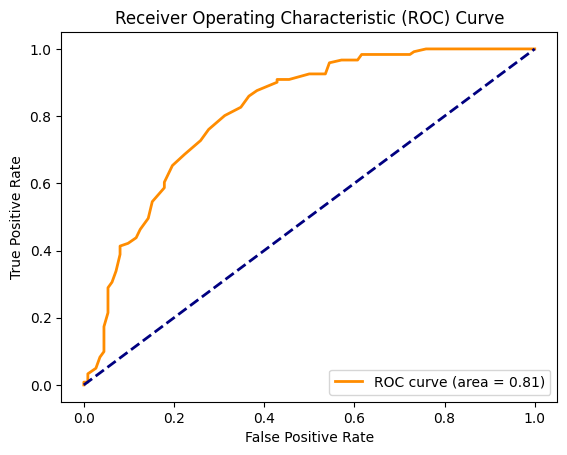


Training SVM (RBF)...

Training -end 52.372806549072266...


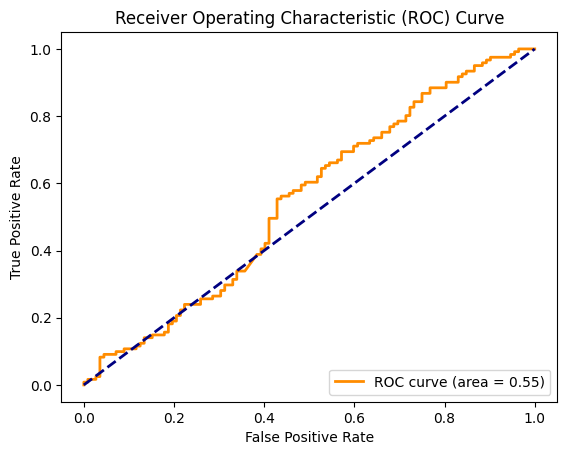


Training SVM (Linear)...

Training -end 26.23120617866516...


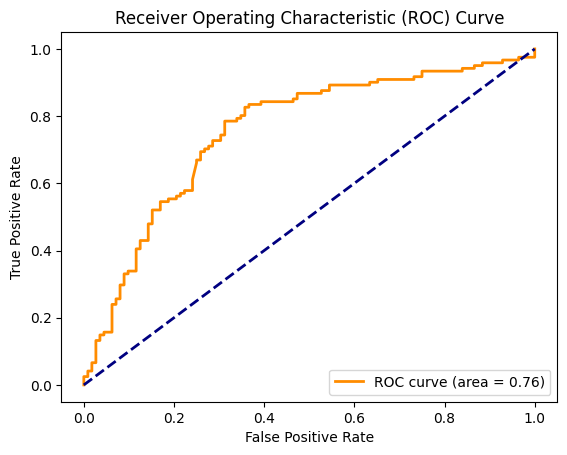


Training Logistic Regression...

Training -end 28.62061071395874...


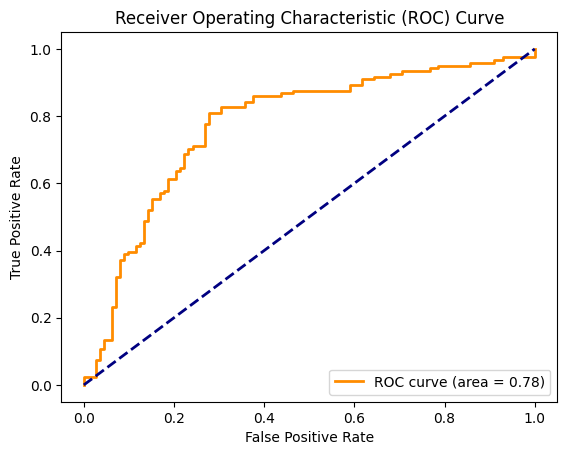


Training Decision Tree...

Training -end 13.891905784606934...


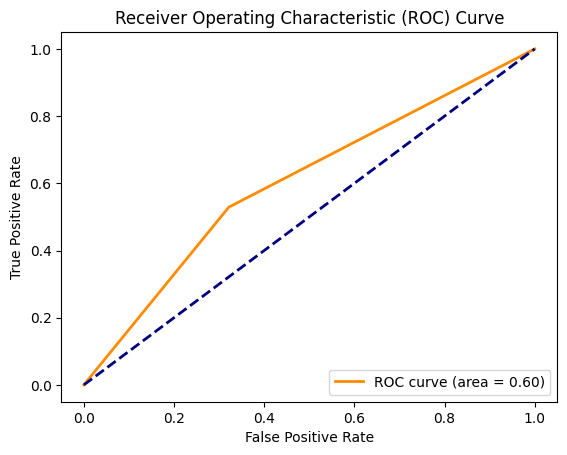


Training KNN...


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec


Training -end 0.6332731246948242...


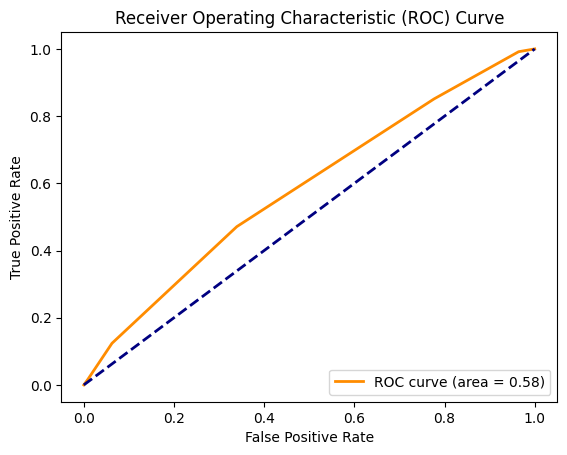


Training Naive Bayes...

Training -end 0.6536519527435303...


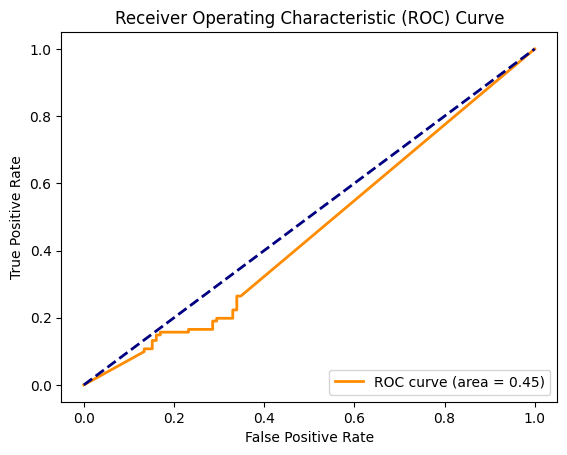


Running Deep Learning Model...
Epoch 1/200
136/136 - 14s - 106ms/step - accuracy: 0.4959 - loss: 0.7484 - val_accuracy: 0.4828 - val_loss: 0.7035
Epoch 2/200
136/136 - 1s - 11ms/step - accuracy: 0.5318 - loss: 0.6912 - val_accuracy: 0.4612 - val_loss: 0.7347
Epoch 3/200
136/136 - 1s - 11ms/step - accuracy: 0.5475 - loss: 0.6887 - val_accuracy: 0.5431 - val_loss: 0.6846
Epoch 4/200
136/136 - 1s - 11ms/step - accuracy: 0.5207 - loss: 0.6907 - val_accuracy: 0.5345 - val_loss: 0.6927
Epoch 5/200
136/136 - 1s - 11ms/step - accuracy: 0.5594 - loss: 0.6895 - val_accuracy: 0.5043 - val_loss: 0.6987
Epoch 6/200
136/136 - 1s - 11ms/step - accuracy: 0.5558 - loss: 0.6828 - val_accuracy: 0.4871 - val_loss: 0.7448
Epoch 7/200
136/136 - 1s - 11ms/step - accuracy: 0.5724 - loss: 0.6816 - val_accuracy: 0.5000 - val_loss: 0.7042
Epoch 8/200
136/136 - 1s - 11ms/step - accuracy: 0.5696 - loss: 0.6862 - val_accuracy: 0.4828 - val_loss: 0.7165
Epoch 9/200
136/136 - 1s - 11ms/step - accuracy: 0.5770 - loss

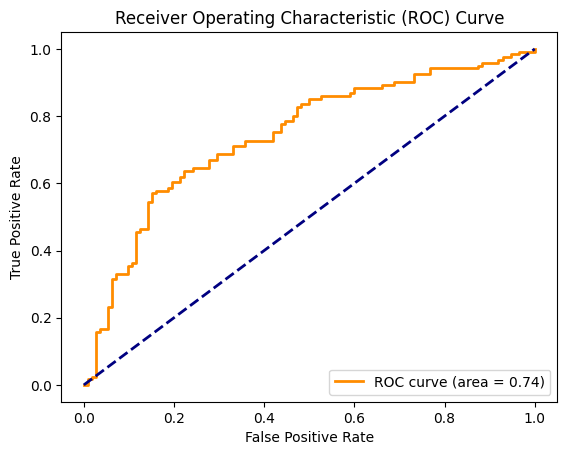

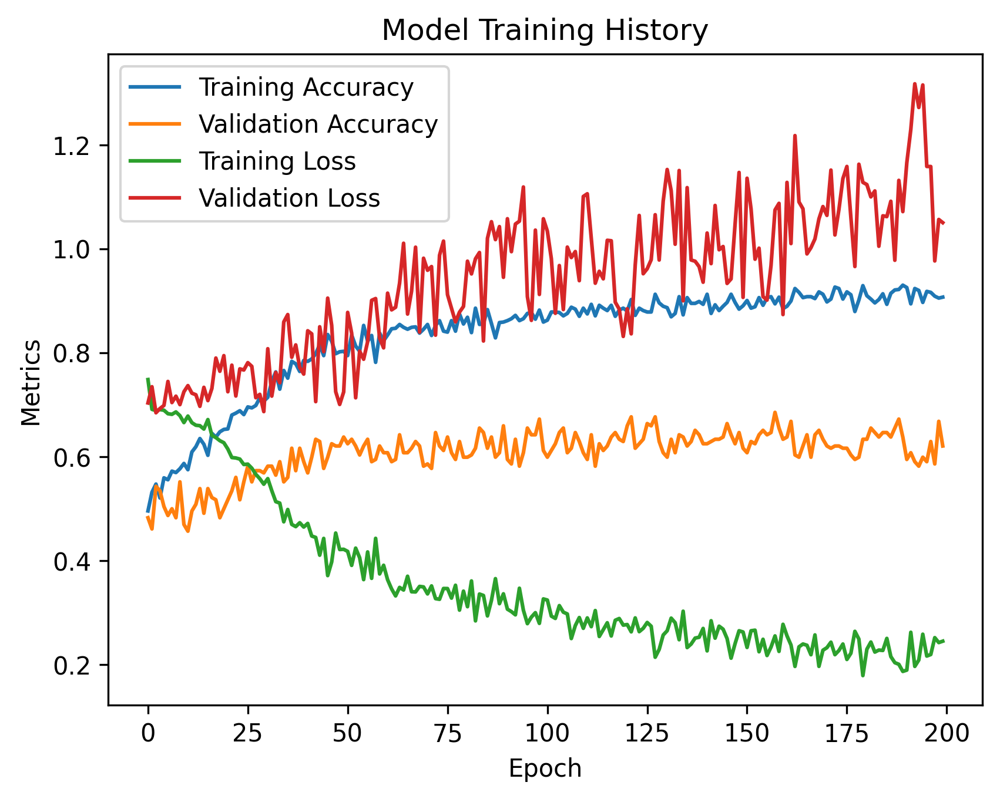


Processing: Necker cube - theta
Pre-Process time = 47.40 seconds

Running Traditional ML Models...

Training Random Forest...

Training -end 3.154282569885254...


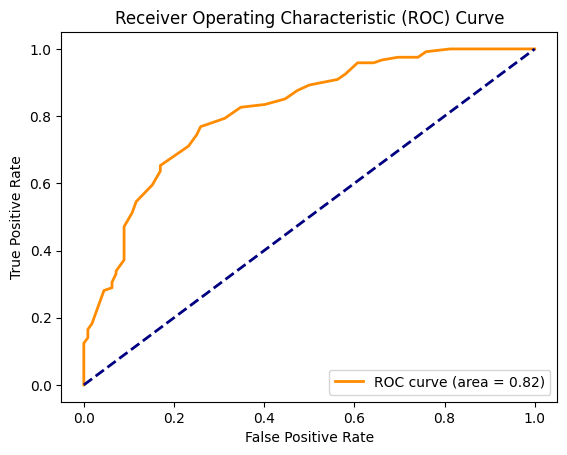


Training SVM (RBF)...

Training -end 50.603572845458984...


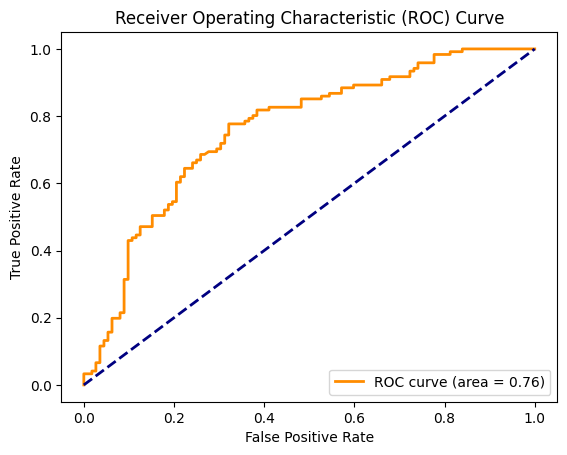


Training SVM (Linear)...

Training -end 21.87154483795166...


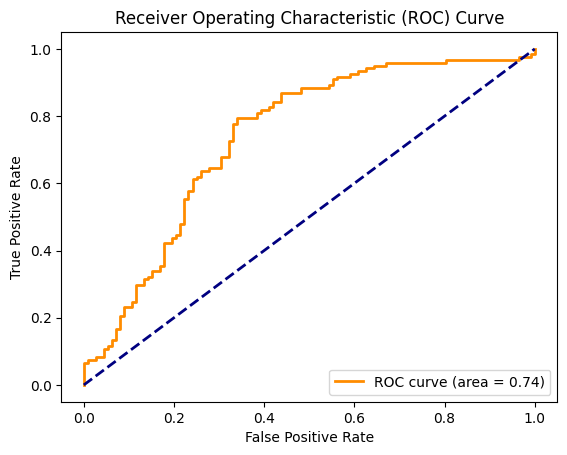


Training Logistic Regression...

Training -end 11.83980417251587...


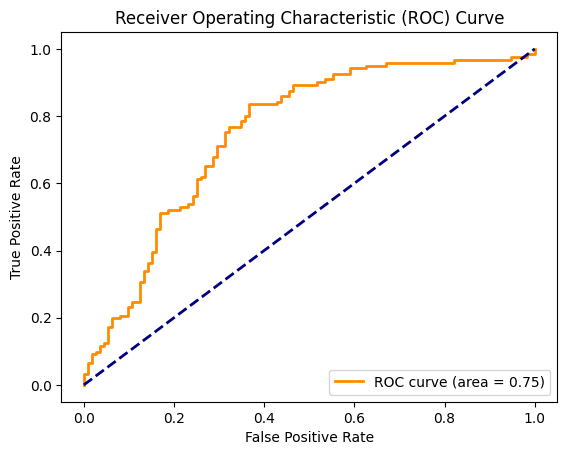


Training Decision Tree...

Training -end 13.544716119766235...


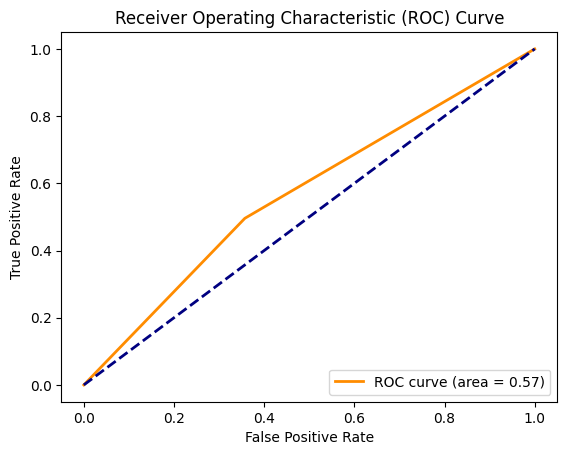


Training KNN...


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec


Training -end 0.596820592880249...


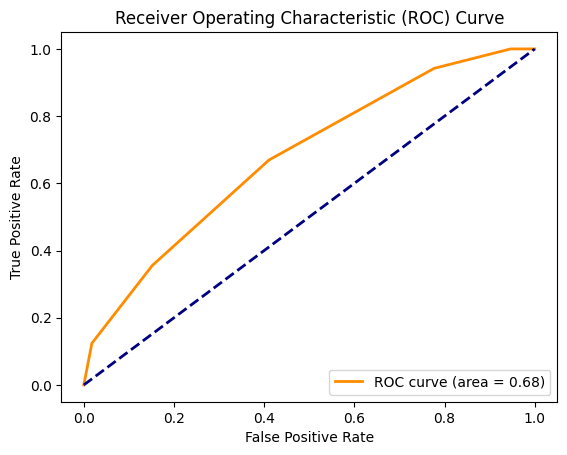


Training Naive Bayes...

Training -end 0.6433825492858887...


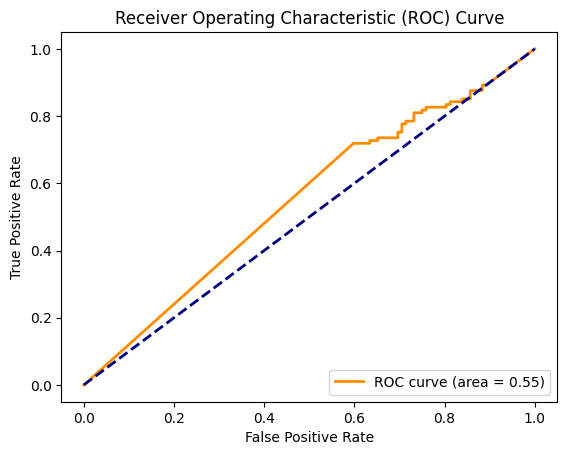


Running Deep Learning Model...
Epoch 1/200
136/136 - 14s - 106ms/step - accuracy: 0.5078 - loss: 0.7412 - val_accuracy: 0.4698 - val_loss: 0.7120
Epoch 2/200
136/136 - 1s - 11ms/step - accuracy: 0.5272 - loss: 0.6950 - val_accuracy: 0.4828 - val_loss: 0.7107
Epoch 3/200
136/136 - 1s - 11ms/step - accuracy: 0.5447 - loss: 0.6921 - val_accuracy: 0.5000 - val_loss: 0.7074
Epoch 4/200
136/136 - 1s - 11ms/step - accuracy: 0.5521 - loss: 0.6922 - val_accuracy: 0.5603 - val_loss: 0.6957
Epoch 5/200
136/136 - 1s - 11ms/step - accuracy: 0.5742 - loss: 0.6827 - val_accuracy: 0.5043 - val_loss: 0.7081
Epoch 6/200
136/136 - 1s - 11ms/step - accuracy: 0.5364 - loss: 0.6893 - val_accuracy: 0.5474 - val_loss: 0.6980
Epoch 7/200
136/136 - 1s - 11ms/step - accuracy: 0.5899 - loss: 0.6714 - val_accuracy: 0.4957 - val_loss: 0.7156
Epoch 8/200
136/136 - 1s - 11ms/step - accuracy: 0.5982 - loss: 0.6692 - val_accuracy: 0.4871 - val_loss: 0.7411
Epoch 9/200
136/136 - 1s - 11ms/step - accuracy: 0.6028 - loss

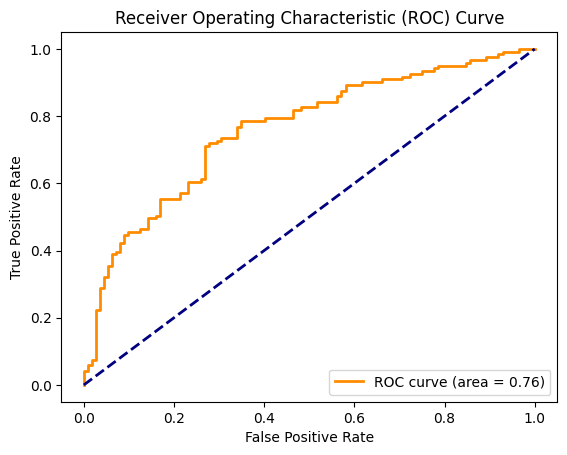

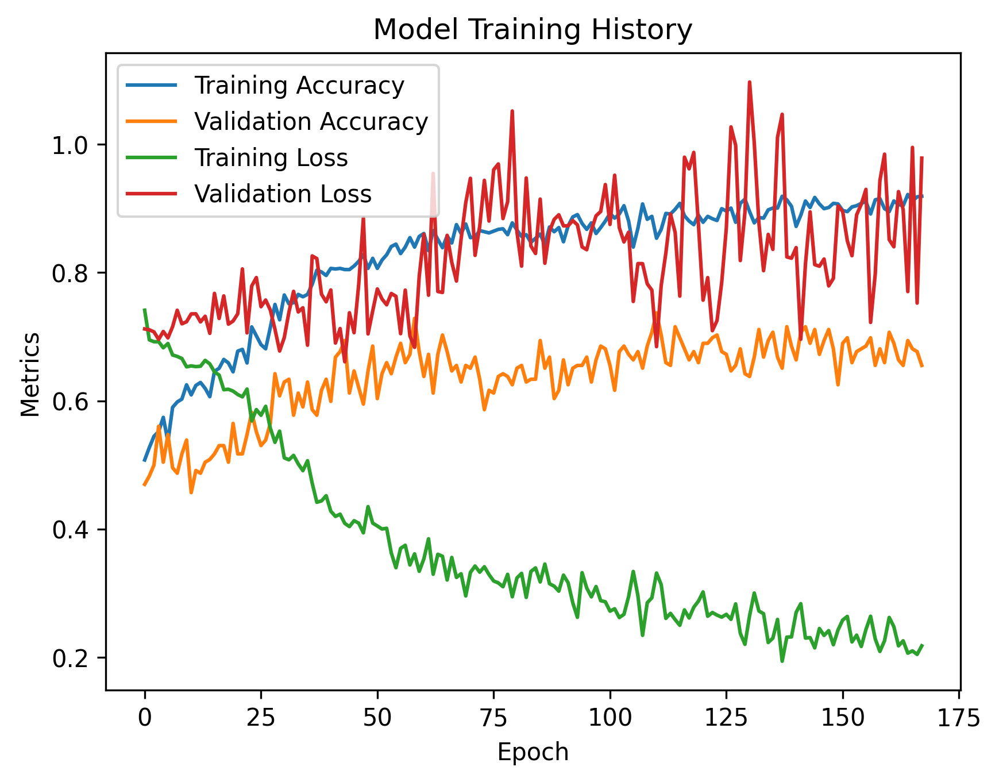


Processing: Necker cube - alpha
Pre-Process time = 47.65 seconds

Running Traditional ML Models...

Training Random Forest...

Training -end 3.2234232425689697...


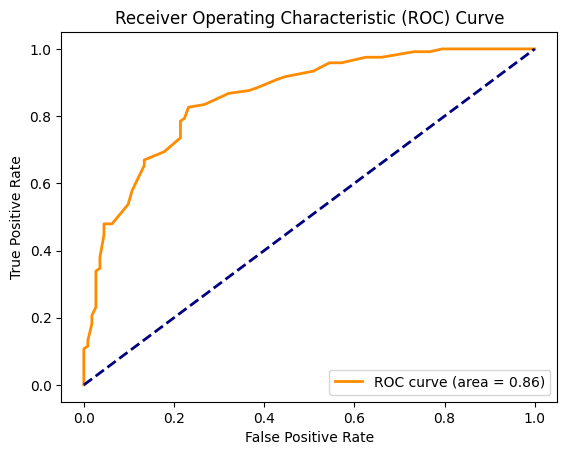


Training SVM (RBF)...

Training -end 53.48612093925476...


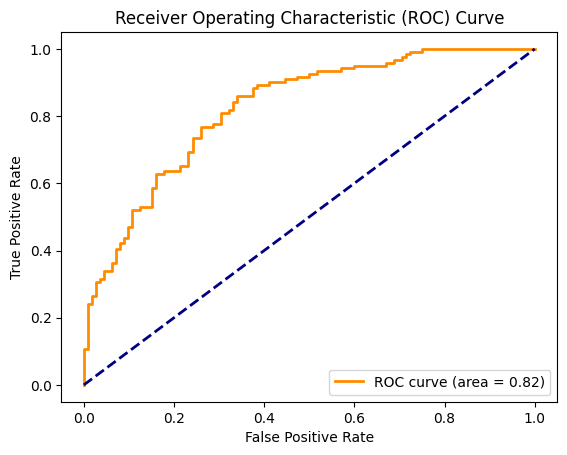


Training SVM (Linear)...

Training -end 21.129319667816162...


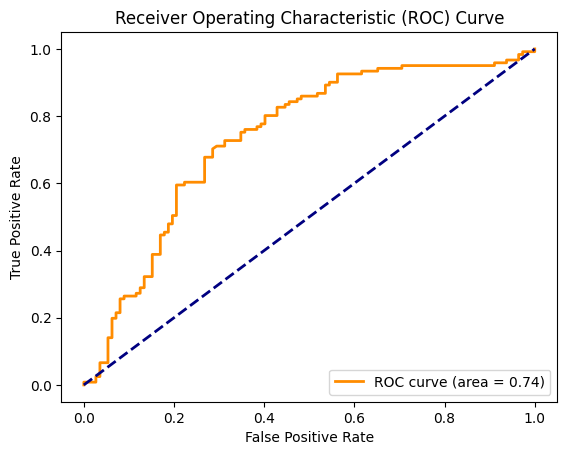


Training Logistic Regression...

Training -end 9.368932008743286...


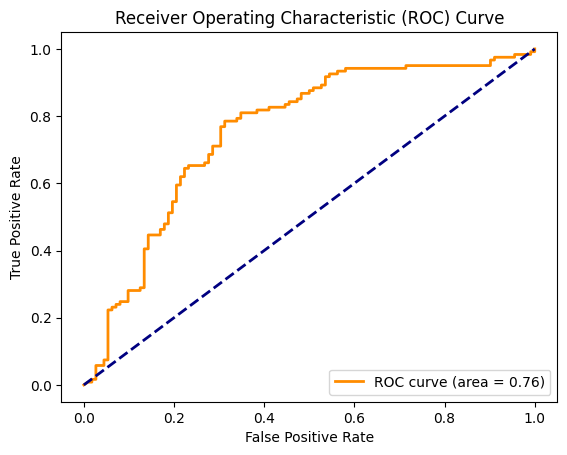


Training Decision Tree...

Training -end 14.198293447494507...


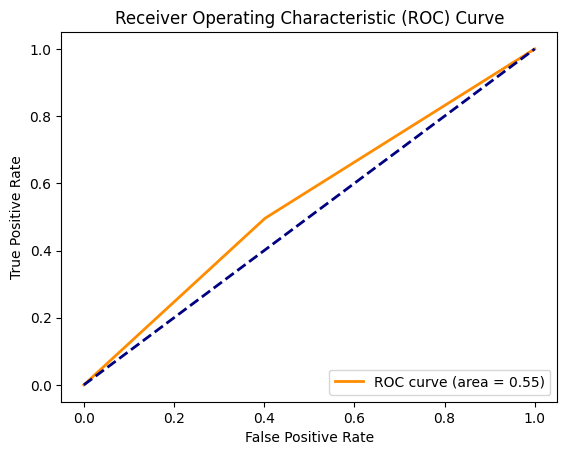


Training KNN...


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec


Training -end 0.6814823150634766...


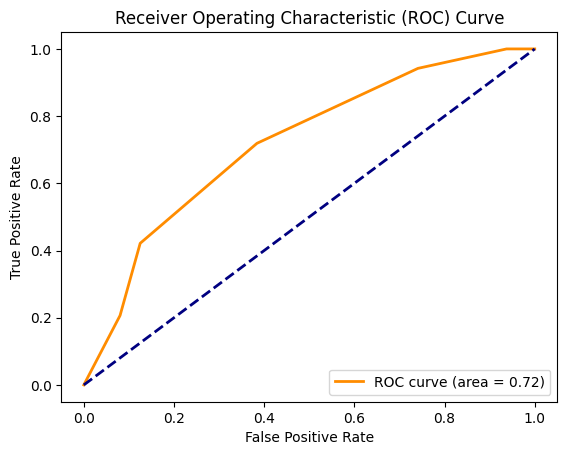


Training Naive Bayes...

Training -end 0.6460955142974854...


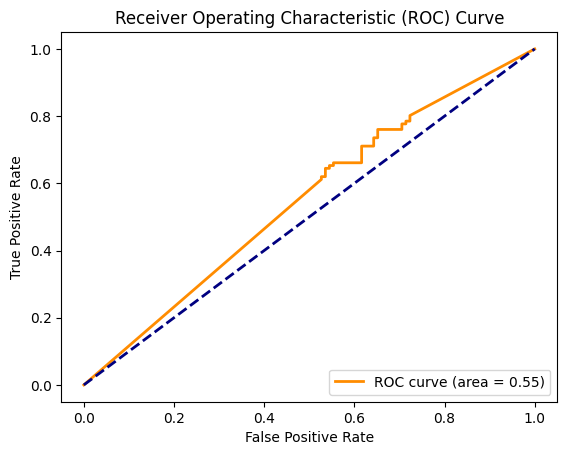


Running Deep Learning Model...
Epoch 1/200
136/136 - 15s - 107ms/step - accuracy: 0.5115 - loss: 0.7492 - val_accuracy: 0.5259 - val_loss: 0.7039
Epoch 2/200
136/136 - 1s - 11ms/step - accuracy: 0.5290 - loss: 0.7005 - val_accuracy: 0.5302 - val_loss: 0.6972
Epoch 3/200
136/136 - 1s - 11ms/step - accuracy: 0.5585 - loss: 0.6903 - val_accuracy: 0.4871 - val_loss: 0.7260
Epoch 4/200
136/136 - 1s - 11ms/step - accuracy: 0.5290 - loss: 0.6901 - val_accuracy: 0.4914 - val_loss: 0.7024
Epoch 5/200
136/136 - 1s - 11ms/step - accuracy: 0.5733 - loss: 0.6811 - val_accuracy: 0.4957 - val_loss: 0.7240
Epoch 6/200
136/136 - 1s - 11ms/step - accuracy: 0.5880 - loss: 0.6747 - val_accuracy: 0.5259 - val_loss: 0.7045
Epoch 7/200
136/136 - 1s - 11ms/step - accuracy: 0.6286 - loss: 0.6545 - val_accuracy: 0.5862 - val_loss: 0.6782
Epoch 8/200
136/136 - 1s - 11ms/step - accuracy: 0.6120 - loss: 0.6701 - val_accuracy: 0.5388 - val_loss: 0.6957
Epoch 9/200
136/136 - 1s - 11ms/step - accuracy: 0.6101 - loss

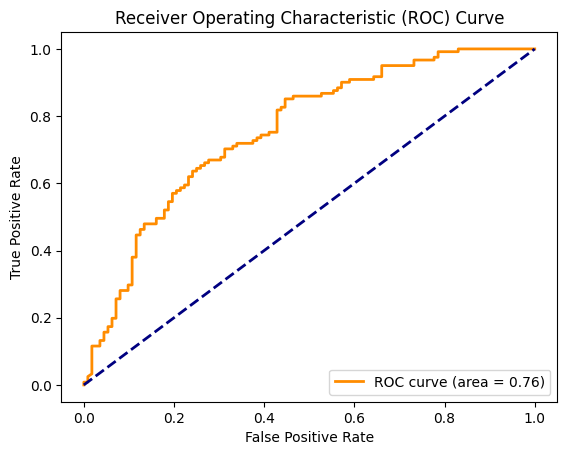

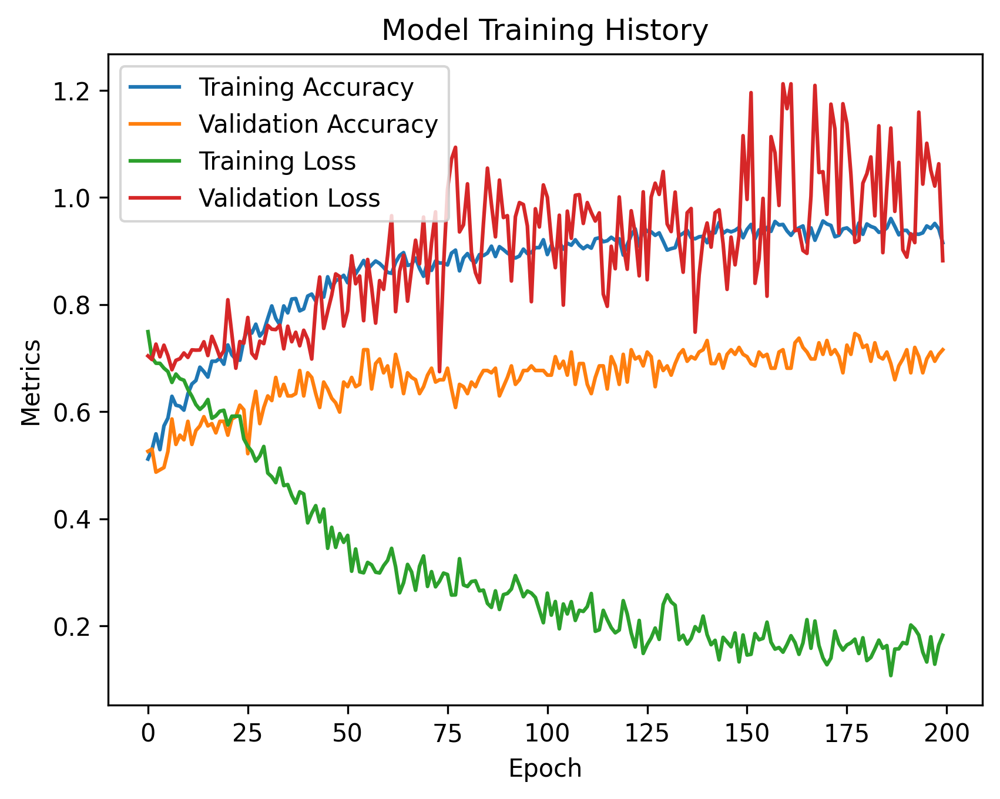


Processing: Necker cube - beta
Pre-Process time = 47.65 seconds

Running Traditional ML Models...

Training Random Forest...

Training -end 3.0884768962860107...


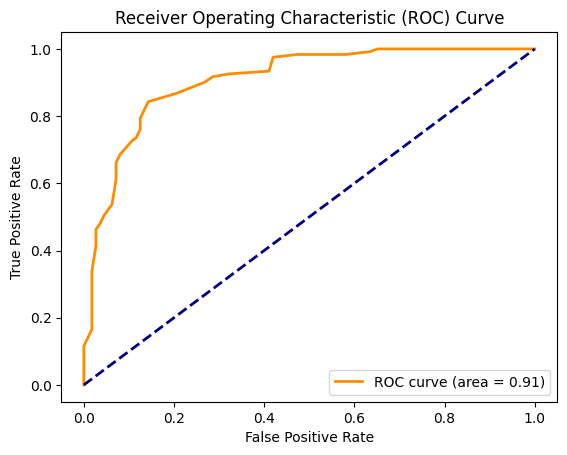


Training SVM (RBF)...

Training -end 51.89745330810547...


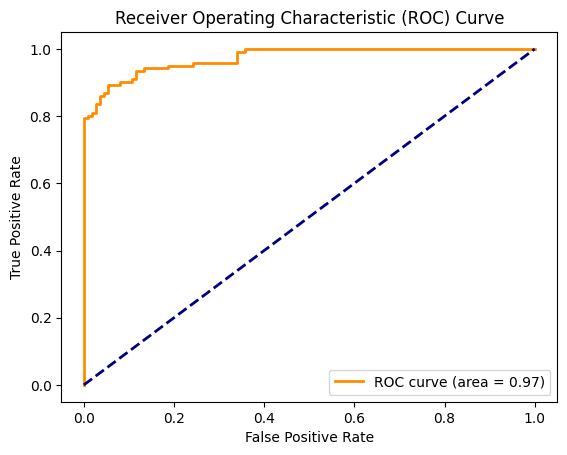


Training SVM (Linear)...

Training -end 27.022711753845215...


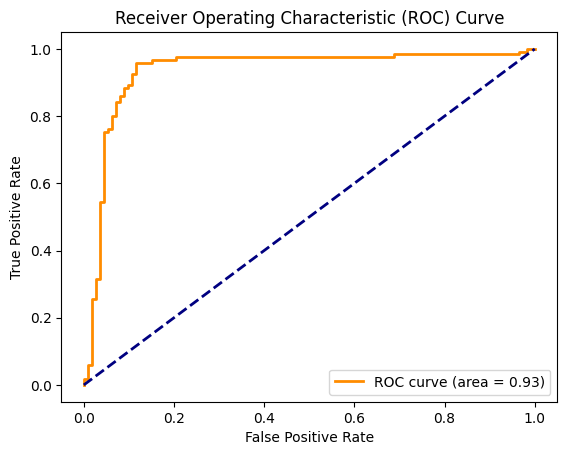


Training Logistic Regression...

Training -end 2.637178421020508...


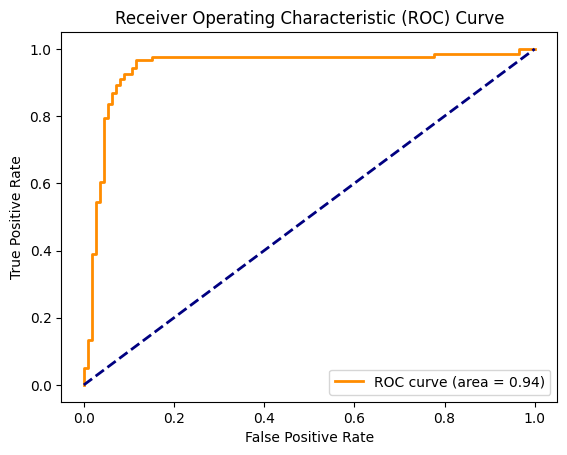


Training Decision Tree...

Training -end 14.07149600982666...


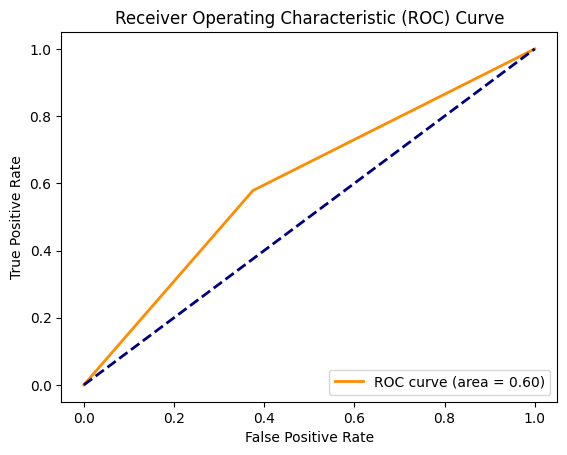


Training KNN...


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec


Training -end 0.6354818344116211...


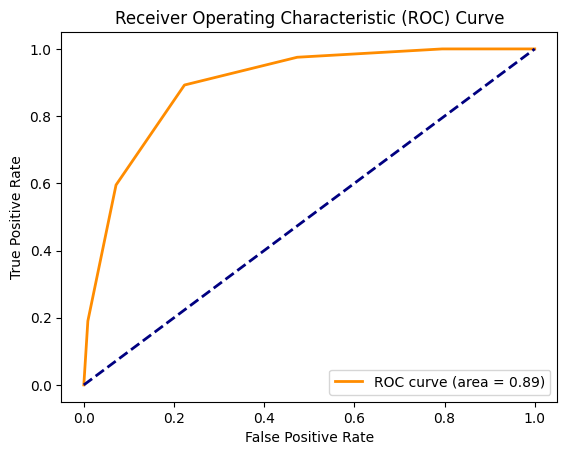


Training Naive Bayes...

Training -end 0.6429955959320068...


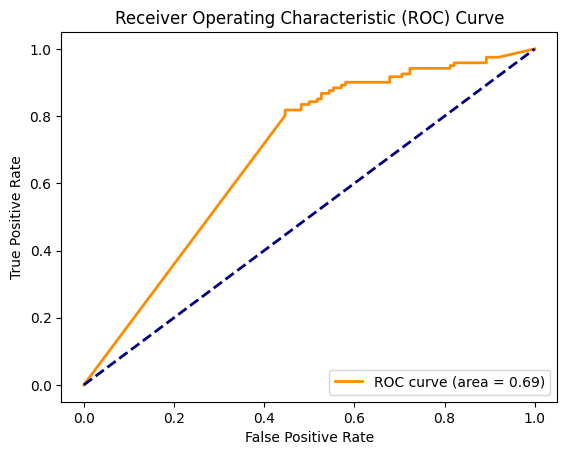


Running Deep Learning Model...
Epoch 1/200
136/136 - 15s - 107ms/step - accuracy: 0.5336 - loss: 0.7148 - val_accuracy: 0.5905 - val_loss: 0.6755
Epoch 2/200
136/136 - 1s - 11ms/step - accuracy: 0.5797 - loss: 0.6675 - val_accuracy: 0.5819 - val_loss: 0.6743
Epoch 3/200
136/136 - 1s - 11ms/step - accuracy: 0.6562 - loss: 0.6214 - val_accuracy: 0.6293 - val_loss: 0.6564
Epoch 4/200
136/136 - 1s - 11ms/step - accuracy: 0.7032 - loss: 0.5800 - val_accuracy: 0.6767 - val_loss: 0.5943
Epoch 5/200
136/136 - 1s - 11ms/step - accuracy: 0.7770 - loss: 0.4882 - val_accuracy: 0.7759 - val_loss: 0.4997
Epoch 6/200
136/136 - 1s - 11ms/step - accuracy: 0.7779 - loss: 0.4846 - val_accuracy: 0.7586 - val_loss: 0.5587
Epoch 7/200
136/136 - 1s - 11ms/step - accuracy: 0.8018 - loss: 0.4454 - val_accuracy: 0.7629 - val_loss: 0.5626
Epoch 8/200
136/136 - 1s - 11ms/step - accuracy: 0.7908 - loss: 0.4652 - val_accuracy: 0.7414 - val_loss: 0.5461
Epoch 9/200
136/136 - 1s - 11ms/step - accuracy: 0.8055 - loss

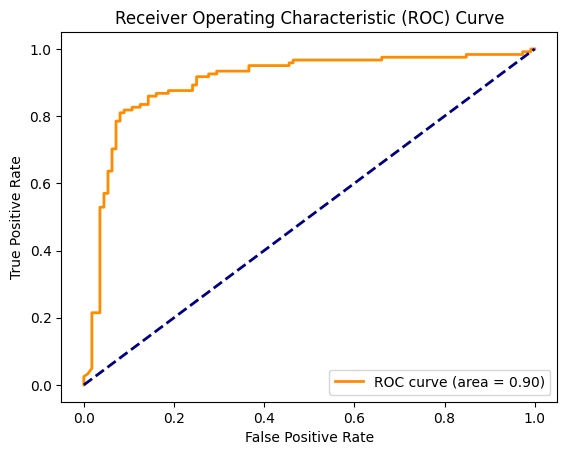

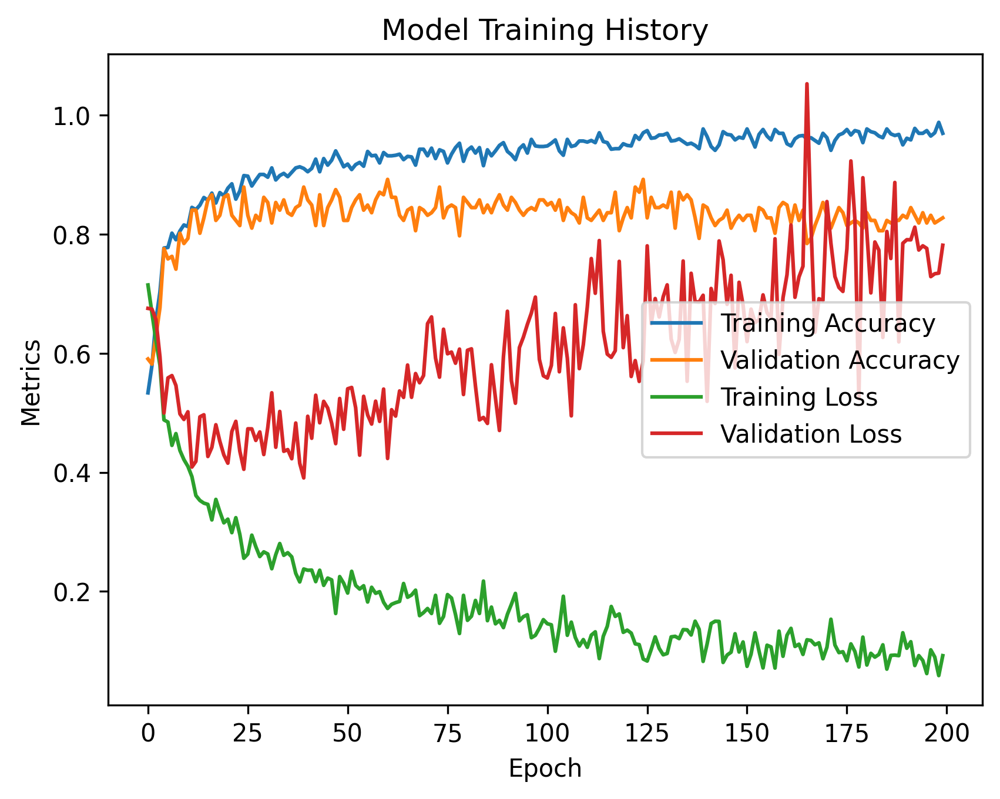


Processing: Necker cube - gamma
Pre-Process time = 48.14 seconds

Running Traditional ML Models...

Training Random Forest...

Training -end 3.0087990760803223...


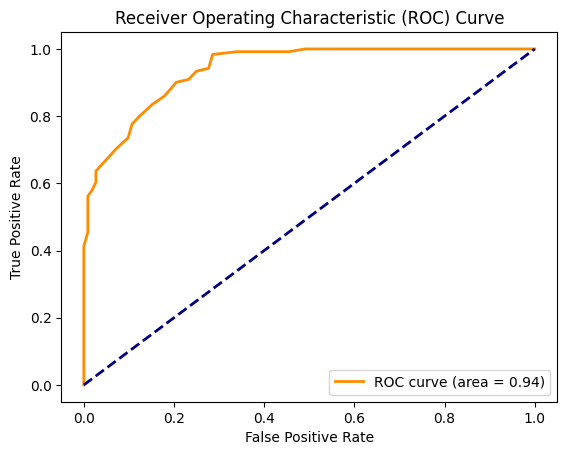


Training SVM (RBF)...

Training -end 48.43987560272217...


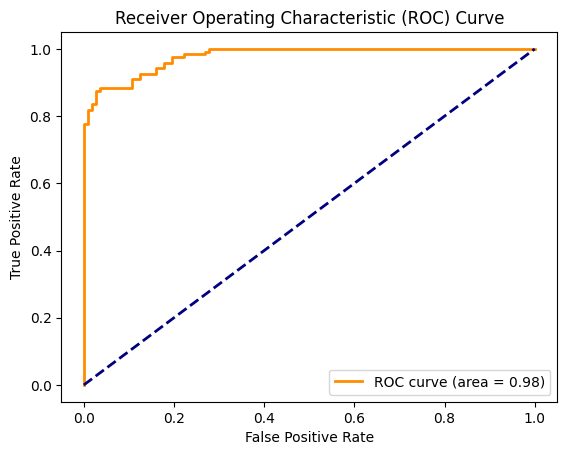


Training SVM (Linear)...

Training -end 19.674014568328857...


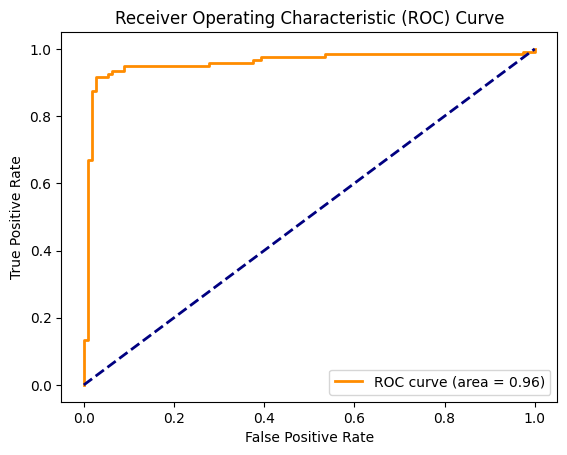


Training Logistic Regression...

Training -end 2.6655962467193604...


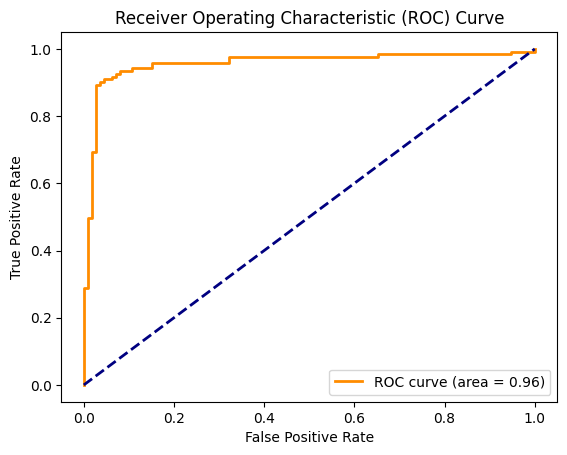


Training Decision Tree...

Training -end 11.313951969146729...


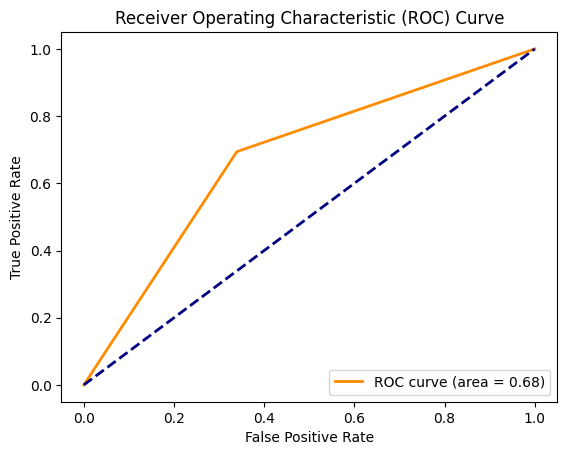


Training KNN...


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec


Training -end 1.099461555480957...


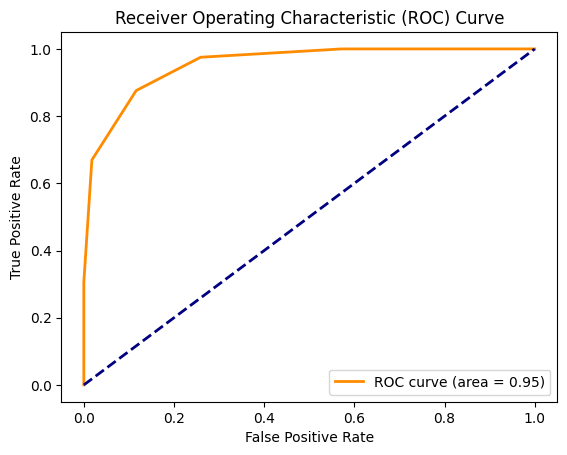


Training Naive Bayes...

Training -end 0.6658918857574463...


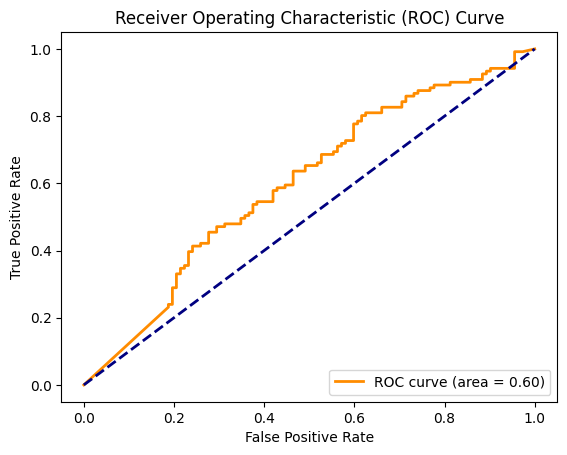


Running Deep Learning Model...
Epoch 1/200
136/136 - 15s - 107ms/step - accuracy: 0.5834 - loss: 0.7511 - val_accuracy: 0.6379 - val_loss: 0.6432
Epoch 2/200
136/136 - 2s - 11ms/step - accuracy: 0.6977 - loss: 0.5932 - val_accuracy: 0.7284 - val_loss: 0.5581
Epoch 3/200
136/136 - 1s - 11ms/step - accuracy: 0.7530 - loss: 0.5123 - val_accuracy: 0.7845 - val_loss: 0.4991
Epoch 4/200
136/136 - 1s - 11ms/step - accuracy: 0.7862 - loss: 0.4717 - val_accuracy: 0.7802 - val_loss: 0.5051
Epoch 5/200
136/136 - 1s - 11ms/step - accuracy: 0.8166 - loss: 0.4268 - val_accuracy: 0.7716 - val_loss: 0.4708
Epoch 6/200
136/136 - 1s - 11ms/step - accuracy: 0.8295 - loss: 0.3940 - val_accuracy: 0.8362 - val_loss: 0.4250
Epoch 7/200
136/136 - 1s - 11ms/step - accuracy: 0.8387 - loss: 0.3772 - val_accuracy: 0.8362 - val_loss: 0.4208
Epoch 8/200
136/136 - 1s - 11ms/step - accuracy: 0.8664 - loss: 0.3499 - val_accuracy: 0.7974 - val_loss: 0.4812
Epoch 9/200
136/136 - 1s - 11ms/step - accuracy: 0.8654 - loss

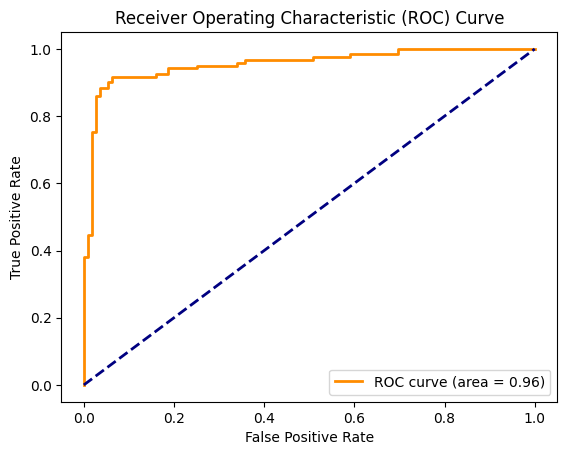

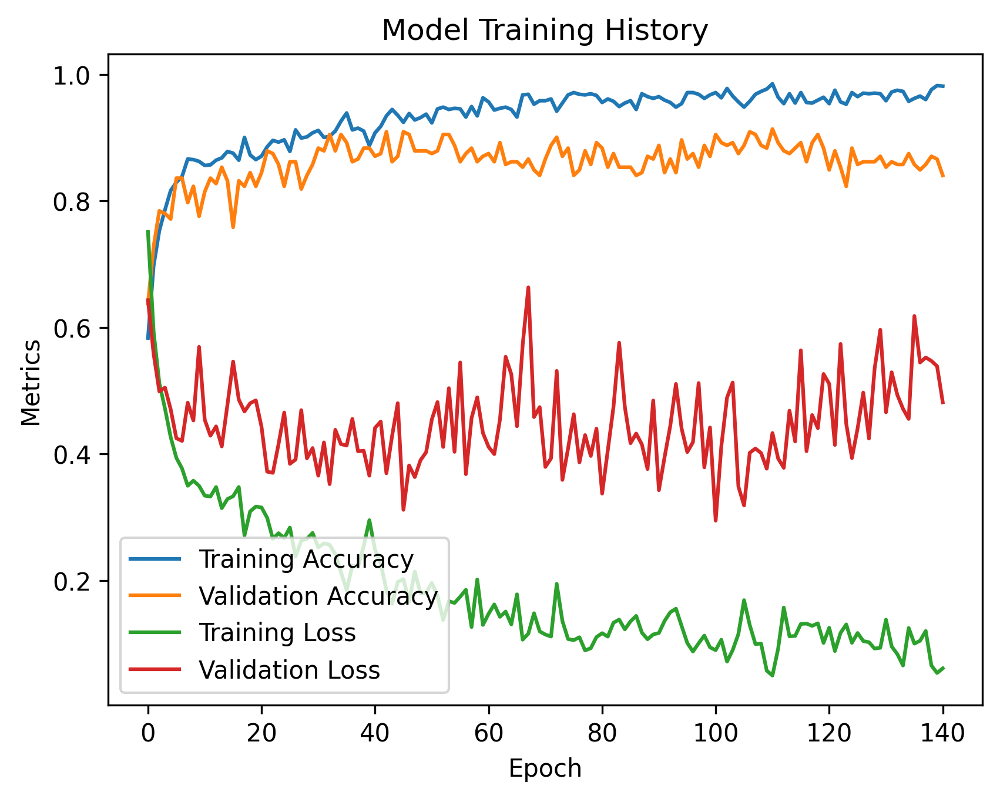

                             Model  Accuracy  Precision    Recall  F1-Score  \
0                    Random Forest  0.759657   0.792793  0.727273  0.758621   
1                        SVM (RBF)  0.527897   0.569620  0.371901  0.450000   
2                     SVM (Linear)  0.725322   0.752212  0.702479  0.726496   
3              Logistic Regression  0.751073   0.778761  0.727273  0.752137   
4                    Decision Tree  0.570815   0.588235  0.578512  0.583333   
..                             ...       ...        ...       ...       ...   
75             Logistic Regression  0.922747   0.940171  0.909091  0.924370   
76                   Decision Tree  0.678112   0.688525  0.694215  0.691358   
77                             KNN  0.879828   0.890756  0.876033  0.883333   
78                     Naive Bayes  0.515021   0.580000  0.239669  0.339181   
79  Deep Learning (Neural Network)  0.918455   0.955357  0.884298  0.918455   

    Specificity  Sensitivity  Cohen_Kappa   ROC_AUC

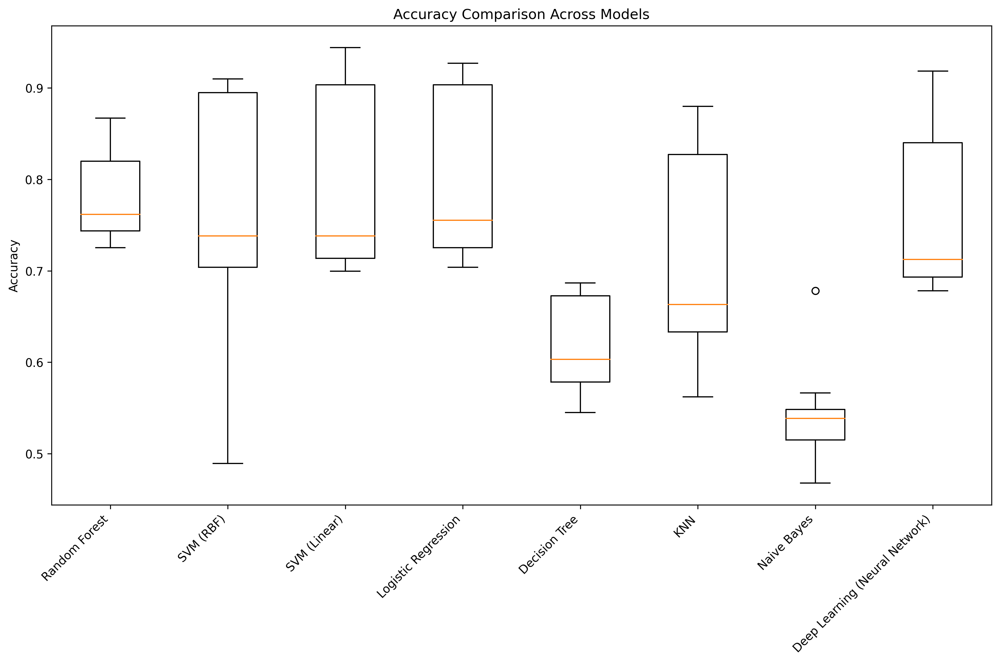

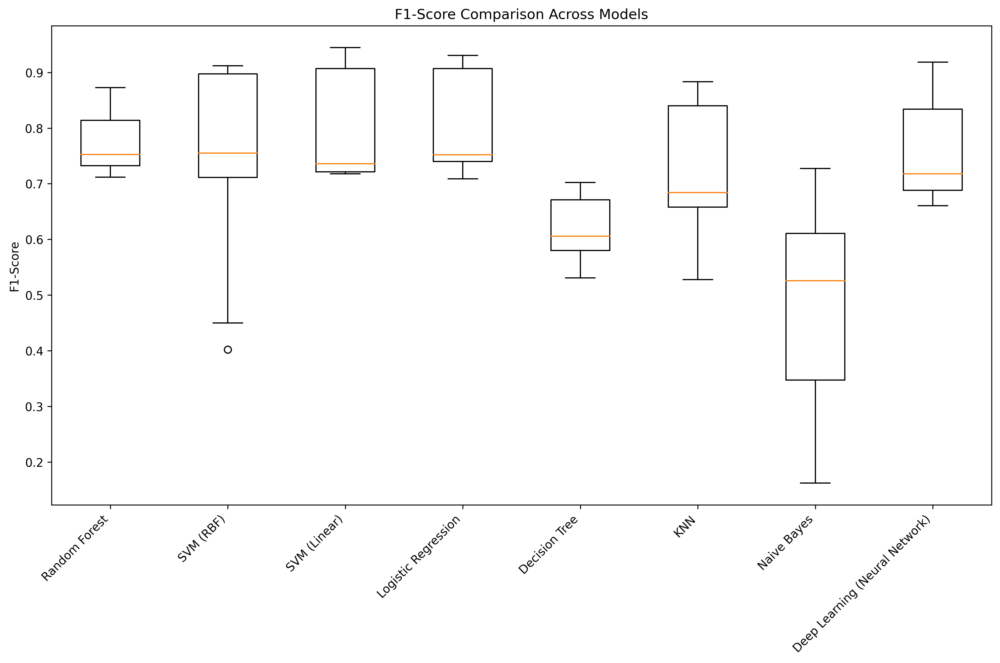

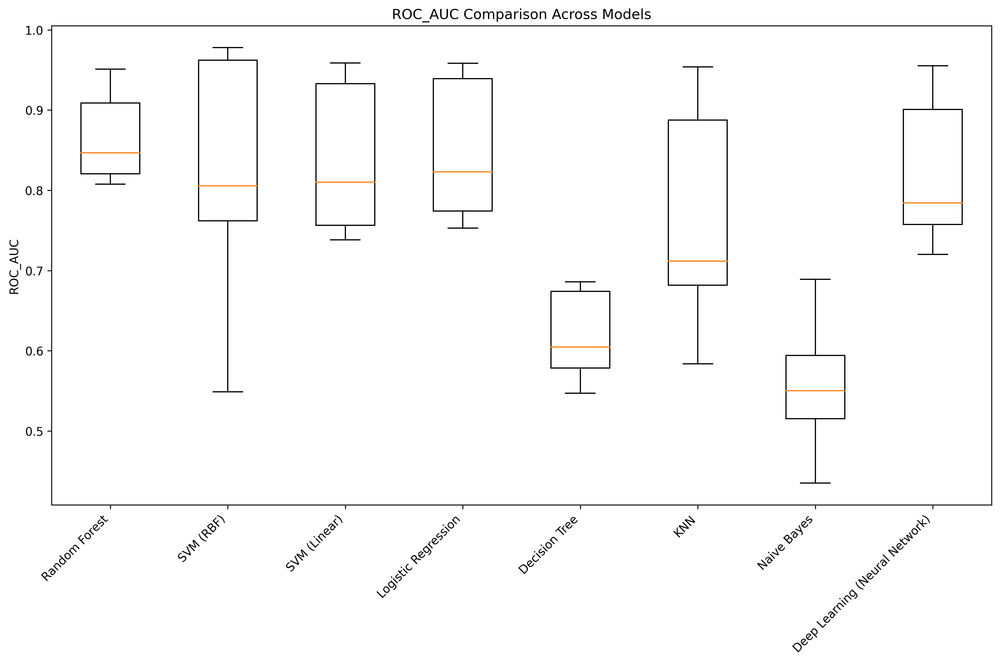

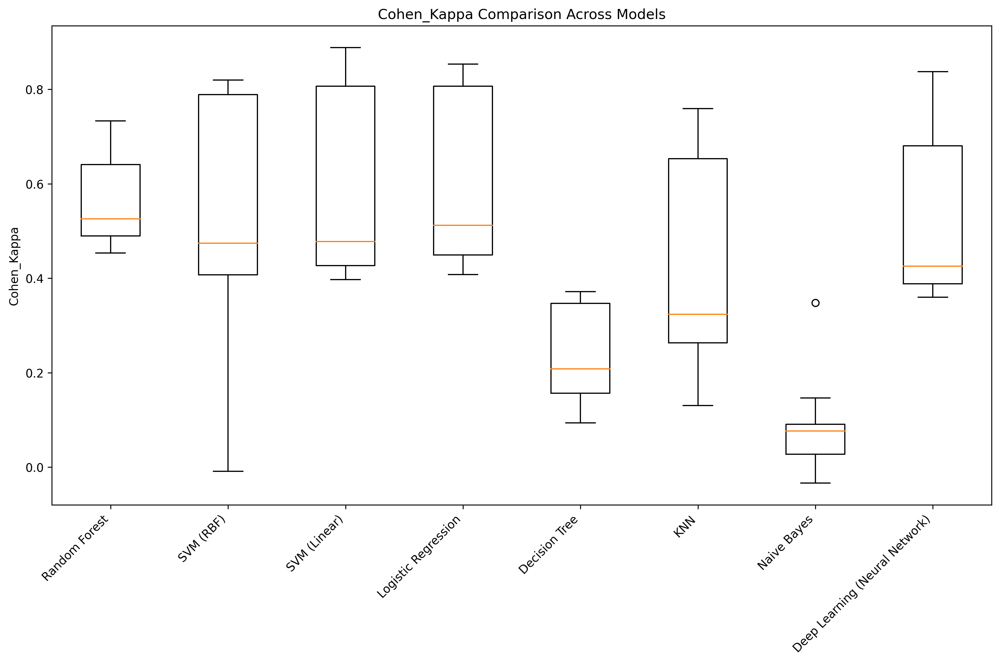

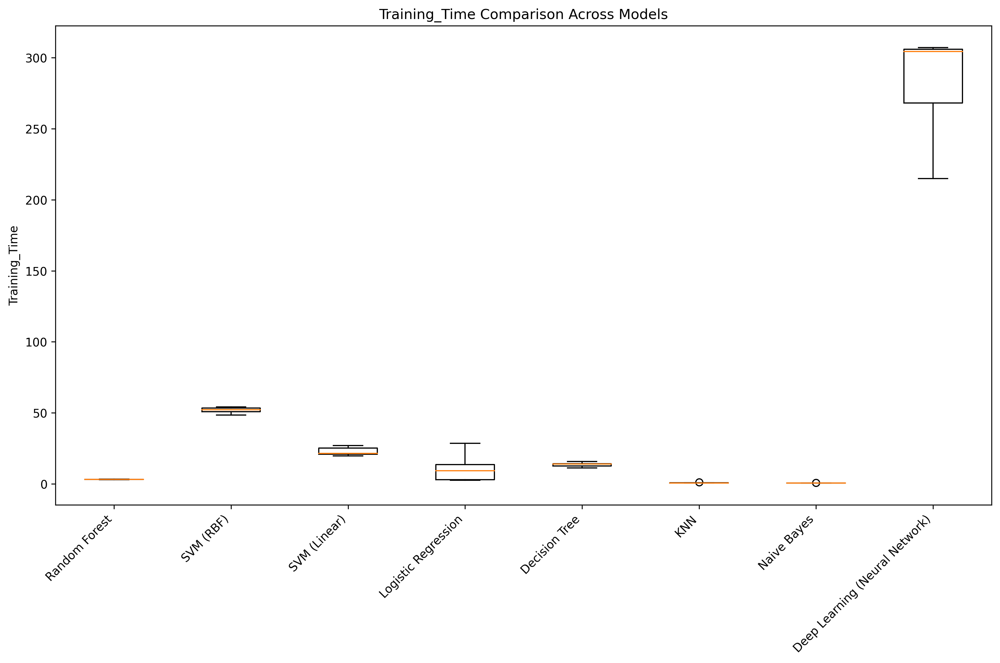


SUMMARY STATISTICS
                               Accuracy         F1-Score         ROC_AUC  \
                                   mean     std     mean     std    mean   
Model                                                                      
Decision Tree                    0.6197  0.0527   0.6174  0.0611  0.6208   
Deep Learning (Neural Network)   0.7614  0.0875   0.7588  0.0894  0.8212   
KNN                              0.7112  0.1199   0.7206  0.1244  0.7622   
Logistic Regression              0.8030  0.0948   0.8080  0.0925  0.8489   
Naive Bayes                      0.5386  0.0586   0.4677  0.1927  0.5564   
Random Forest                    0.7815  0.0493   0.7743  0.0559  0.8671   
SVM (Linear)                     0.7979  0.1029   0.8024  0.1004  0.8385   
SVM (RBF)                        0.7502  0.1525   0.7402  0.1841  0.8171   

                                       Cohen_Kappa         Training_Time  \
                                   std        mean     std         

In [11]:


# Existing EEG class (keeping original structure)
class EEG:
    def __init__(self, participant, datasets):
        self.int = {}
        self.delta = {}
        self.theta = {}
        self.alpha = {}
        self.beta = {}
        self.gamma = {}
        base = "/kaggle/input/31eegchannel5participants/datasets/"
        intensities = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
        for dataset in datasets:
            if dataset == "Mona Lisa":
                Dname = "/Figs for spectra"
                var1 = "/Backgr_int_"
                var2 = ".dat"
            else:
                Dname = "/Cubes for spectra"
                var1 = "/Backgr_int_"
                var2 = "_type_0.4.dat"
            for intensity in intensities:
                S = os.path.join(base, "Participant " + str(participant) + Dname + 
                               var1 + str(intensity) + var2)
                I = intensity
                self.int[I] = np.loadtxt(S)
                delta_signal = np.empty(self.int[I].shape)
                theta_signal = np.empty(self.int[I].shape)
                alpha_signal = np.empty(self.int[I].shape)
                beta_signal = np.empty(self.int[I].shape)
                gamma_signal = np.empty(self.int[I].shape)
                for c in range(self.int[I].shape[1]):
                    delta_signal[:,c], theta_signal[:,c], alpha_signal[:, c], \
                    beta_signal[:, c], gamma_signal[:,c] = self.fir_filtering(I, c)
                self.delta[I] = delta_signal
                self.theta[I] = theta_signal
                self.alpha[I] = alpha_signal
                self.beta[I] = beta_signal
                self.gamma[I] = gamma_signal
    
    def fir_filtering(self, I, c):
        filter_delta = signal.firwin(400, [1.0, 4.0], pass_zero=False, fs=250)
        filter_theta = signal.firwin(400, [5.0, 8.0], pass_zero=False, fs=250)
        filter_alpha = signal.firwin(400, [8.0, 12.0], pass_zero=False, fs=250)
        filter_beta = signal.firwin(400, [13.0, 30.0], pass_zero=False, fs=250)
        filter_gamma = signal.firwin(400, [31.0, 45.0], pass_zero=False, fs=250)
        res_delta = signal.convolve(self.int[I][:, c], filter_delta, mode='same')
        res_theta = signal.convolve(self.int[I][:, c], filter_theta, mode='same')
        res_alpha = signal.convolve(self.int[I][:, c], filter_alpha, mode='same')
        res_beta = signal.convolve(self.int[I][:, c], filter_beta, mode='same')
        res_gamma = signal.convolve(self.int[I][:, c], filter_gamma, mode='same')
        return res_delta, res_theta, res_alpha, res_beta, res_gamma

# Initialize global variables
Intencity = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
base = "/kaggle/input/31eegchannel5participants/datasets/"
file_path = os.path.join(base, "Channels.dat")
df_channels = pd.read_csv(file_path, header=None, sep='.')
channel_names = df_channels.iloc[:, -1:].values.flatten()

def convart_sin_fiq(fiq):
    if fiq == 'delta':
        return 1
    elif fiq == 'theta':
        return 2
    elif fiq == 'alpha':
        return 3
    elif fiq == 'beta':
        return 4
    elif fiq == 'gamma':
        return 5

def createdataframe(user, dataset, signal_fiq):
    global Intencity, channel_names
    tem_signal = []
    eeg_person = EEG(user, dataset)
    for i in Intencity:
        for ch in range(0, 31):
            tem = [channel_names[ch]]
            S = f'tem_signal.append(np.append(eeg_person.{signal_fiq}.get(i)[:, ch][0:15000], tem))'
            exec(S)
    tem_dataframe = pd.DataFrame(tem_signal)
    colunm = []
    for col in range(0, 15000):
        S = 'Time' + str(col)
        colunm.append(S)
    colunm.append("Channel_Name")
    tem_dataframe.columns = colunm
    return tem_dataframe

def create_binary(data):
    data['binary_channel'] = data['Channel_Name'].apply(lambda x: 0 if '-A1' in x else 1 if '-A2' in x else None)
    return data.drop(columns=['Channel_Name'])

def efficient_class(class_report):
    f1_class_0 = class_report['0']['f1-score']
    f1_class_1 = class_report['1']['f1-score']
    most_efficient_class = "left hemiparesis" if f1_class_0 > f1_class_1 else "right hemiparesis"
    return most_efficient_class

def specificity_fun(y_test_encoded, y_test_pred):
    conf_matrix = confusion_matrix(y_test_encoded, y_test_pred)
    tn = conf_matrix[0, 0]
    fp = conf_matrix[0, 1]
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    return specificity

def sensitivity_fun(y_test_encoded, y_test_pred):
    conf_matrix = confusion_matrix(y_test_encoded, y_test_pred)
    tp = conf_matrix[1, 1]
    fn = conf_matrix[1, 0]
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
    return sensitivity

def ROC_plot(y_test_encoded, y_test_pred, name):
    fpr, tpr, thresholds = roc_curve(y_test_encoded, y_test_pred)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    file_name = 'ROC_plot/' + 'ROC_plot_' + name + '.eps'
    output_folder = 'ROC_plot'
    if not os.path.exists(output_folder):
        os.makedirs(output_folder, exist_ok=True)
    plt.savefig(file_name, dpi=300)
    plt.show()
    return roc_auc

# Enhanced Traditional ML Models with comprehensive evaluation
def run_traditional_ml_models(data, name):
    """Run multiple traditional ML models and return comprehensive metrics"""
    y = data['binary_channel']
    X = data.drop(columns=['binary_channel'])
    X = X.apply(pd.to_numeric, errors='coerce')
    
    # Handle any NaN values
    X = X.fillna(0)
    
    # Split the data
    X_train, X_rem, y_train, y_rem = train_test_split(X, y, train_size=0.7, random_state=42)
    X_valid, X_test, y_valid, y_test = train_test_split(X_rem, y_rem, test_size=0.5, random_state=42)
    
    # Scale features for models that require it
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    # Define models to test
    models = {
        'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1),
        'SVM (RBF)': SVC(kernel='rbf', probability=True, random_state=42),
        'SVM (Linear)': SVC(kernel='linear', probability=True, random_state=42),
        'Logistic Regression': LogisticRegression(random_state=42, max_iter=1000),
        'Decision Tree': DecisionTreeClassifier(random_state=42),
        'KNN': KNeighborsClassifier(n_neighbors=5),
        'Naive Bayes': GaussianNB()
    }
    
    results = {}
    
    for model_name, model in models.items():
        print(f"\nTraining {model_name}...")
        start_time = time.time()
        
        # Use scaled data for models that benefit from it
        if model_name in ['SVM (RBF)', 'SVM (Linear)', 'Logistic Regression', 'KNN']:
            X_train_use = X_train_scaled
            X_test_use = X_test_scaled
        else:
            X_train_use = X_train
            X_test_use = X_test
        
        # Train model
        model.fit(X_train_use, y_train)
        
        # Predict
        y_pred = model.predict(X_test_use)
        y_pred_proba = model.predict_proba(X_test_use)[:, 1] if hasattr(model, 'predict_proba') else y_pred
        
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"\nTraining -end {elapsed_time}...")
        
        # Calculate comprehensive metrics
        class_report = classification_report(y_test, y_pred, output_dict=True)
        
        try:
            roc_auc = ROC_plot(y_test, y_pred_proba, f"{name}_{model_name.replace(' ', '_')}")
        except:
            roc_auc = 0.5  # Default if ROC calculation fails
        
        metrics = {
            'Model': model_name,
            'Accuracy': class_report['accuracy'],
            'Precision': class_report['1']['precision'],
            'Recall': class_report['1']['recall'],
            'F1-Score': class_report['1']['f1-score'],
            'Specificity': specificity_fun(y_test, y_pred),
            'Sensitivity': sensitivity_fun(y_test, y_pred),
            'Cohen_Kappa': cohen_kappa_score(y_test, y_pred),
            'ROC_AUC': roc_auc,
            'Training_Time': elapsed_time,
            'Most_Efficient_Class': efficient_class(class_report)
        }
        
        results[model_name] = metrics
        
    return results, X_test

# Enhanced Deep Learning Model with complete metrics
def run_deep_learning_model(data, name):
    """Run deep learning model with comprehensive evaluation"""
    y = data['binary_channel']
    X = data.drop(columns=['binary_channel'])
    X = X.apply(pd.to_numeric, errors='coerce')
    X = X.fillna(0)
    
    tf.keras.backend.clear_session()
    
    # GPU configuration
    gpus = tf.config.experimental.list_physical_devices('GPU')
    if gpus:
        try:
            for gpu in gpus:
                tf.config.experimental.set_memory_growth(gpu, True)
        except RuntimeError as e:
            print(e)
    
    # Split the data
    X_train, X_rem, y_train, y_rem = train_test_split(X, y, train_size=0.7, random_state=42)
    X_valid, X_test, y_valid, y_test = train_test_split(X_rem, y_rem, test_size=0.5, random_state=42)
    
    # Encode labels
    label_encoder = LabelEncoder()
    y_train_encoded = label_encoder.fit_transform(y_train)
    
    # Compute class weights
    class_weights = compute_class_weight('balanced', classes=np.unique(y_train_encoded), y=y_train_encoded)
    class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}
    
    X_train = X_train.astype(np.float32)
    y_train_encoded = y_train_encoded.astype(np.int32)
    
    # Create the model
    model = Sequential()
    model.add(Dense(2500, input_shape=(X_train.shape[1],), activation='tanh'))
    model.add(BatchNormalization())
    model.add(Dense(1000, activation='tanh'))
    model.add(BatchNormalization())
    model.add(Dense(500, activation='tanh'))
    model.add(BatchNormalization())
    model.add(Dense(200, activation='tanh'))
    model.add(BatchNormalization())
    model.add(Dense(100, activation='tanh'))
    model.add(BatchNormalization())
    model.add(Dense(50, activation='tanh'))
    model.add(BatchNormalization())
    model.add(Dense(25, activation='tanh'))
    model.add(BatchNormalization())
    model.add(Dense(15, activation='tanh'))
    model.add(BatchNormalization())
    model.add(Dense(10, activation='tanh'))
    model.add(BatchNormalization())
    model.add(Dense(1, activation='sigmoid'))
    
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    
    callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=30)
    start_time = time.time()
    
    # Train the model
    with tf.device('/GPU:0' if gpus else '/CPU:0'):
        history = model.fit(X_train, y_train_encoded, epochs=200, batch_size=8, verbose=2,
                          validation_data=(X_valid, y_valid), callbacks=[callback],
                          class_weight=class_weight_dict)
    
    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"\ndeep-learning -end {elapsed_time}...")
    
    # Evaluate on test data
    y_test_pred_proba = model.predict(X_test)
    y_test_pred = y_test_pred_proba.round().astype(int).flatten()
    y_test_encoded = label_encoder.transform(y_test)
    
    class_report = classification_report(y_test_encoded, y_test_pred, output_dict=True)
    
    try:
        roc_auc = ROC_plot(y_test_encoded, y_test_pred_proba.flatten(), f"{name}_Deep_Learning")
    except:
        roc_auc = 0.5
    
    metrics = {
        'Model': 'Deep Learning (Neural Network)',
        'Accuracy': class_report['accuracy'],
        'Precision': class_report['1']['precision'],
        'Recall': class_report['1']['recall'],
        'F1-Score': class_report['1']['f1-score'],
        'Specificity': specificity_fun(y_test_encoded, y_test_pred),
        'Sensitivity': sensitivity_fun(y_test_encoded, y_test_pred),
        'Cohen_Kappa': cohen_kappa_score(y_test_encoded, y_test_pred),
        'ROC_AUC': roc_auc,
        'Training_Time': elapsed_time,
        'Most_Efficient_Class': efficient_class(class_report)
    }
    
    # Plot training history
    plt.figure(dpi=300)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Training History')
    plt.ylabel('Metrics')
    plt.xlabel('Epoch')
    plt.legend()
    
    file_save_name = 'MODEL/model_history_' + name + '.eps'
    output_folder = 'MODEL'
    if not os.path.exists(output_folder):
        os.makedirs(output_folder, exist_ok=True)
    plt.savefig(file_save_name, format='eps', bbox_inches='tight', pad_inches=0.1)
    plt.show()
    
    return model, X_test, metrics

# Statistical analysis functions
def perform_statistical_analysis(results_df):
    """Perform ANOVA and t-tests on model results"""
    from scipy import stats
    
    print("\n" + "="*50)
    print("STATISTICAL ANALYSIS")
    print("="*50)
    
    metrics_to_analyze = ['Accuracy', 'F1-Score', 'ROC_AUC', 'Cohen_Kappa']
    
    for metric in metrics_to_analyze:
        print(f"\n--- {metric} Analysis ---")
        
        # Group by dataset and signal frequency
        grouped_data = []
        groups = []
        
        for dataset in results_df['dataset'].unique():
            for signal_fiq in results_df['signal_fiq'].unique():
                subset = results_df[(results_df['dataset'] == dataset) & 
                                  (results_df['signal_fiq'] == signal_fiq)]
                if len(subset) > 1:  # Need at least 2 observations
                    grouped_data.append(subset[metric].values)
                    groups.append(f"{dataset}_{signal_fiq}")
        
        if len(grouped_data) >= 2:
            # Perform ANOVA
            try:
                f_stat, p_value = stats.f_oneway(*grouped_data)
                print(f"ANOVA F-statistic: {f_stat:.4f}")
                print(f"ANOVA p-value: {p_value:.4f}")
                
                if p_value < 0.05:
                    print(f"Significant differences found in {metric} across groups (p < 0.05)")
                else:
                    print(f"No significant differences in {metric} across groups (p >= 0.05)")
                    
            except Exception as e:
                print(f"ANOVA failed for {metric}: {e}")
        
        # Compare Deep Learning vs Traditional Methods
        dl_scores = results_df[results_df['Model'] == 'Deep Learning (Neural Network)'][metric]
        traditional_scores = results_df[results_df['Model'] != 'Deep Learning (Neural Network)'][metric]
        
        if len(dl_scores) > 0 and len(traditional_scores) > 0:
            try:
                t_stat, t_p_value = stats.ttest_ind(dl_scores, traditional_scores)
                print(f"\nDeep Learning vs Traditional Methods ({metric}):")
                print(f"t-statistic: {t_stat:.4f}")
                print(f"p-value: {t_p_value:.4f}")
                
                if t_p_value < 0.05:
                    better_method = "Deep Learning" if dl_scores.mean() > traditional_scores.mean() else "Traditional Methods"
                    print(f"Significant difference found: {better_method} performs better (p < 0.05)")
                else:
                    print("No significant difference between Deep Learning and Traditional Methods (p >= 0.05)")
            except Exception as e:
                print(f"t-test failed for {metric}: {e}")

def create_comparison_plots(results_df, save_path='comparison_plots'):
    """Create comprehensive comparison plots"""
    if not os.path.exists(save_path):
        os.makedirs(save_path, exist_ok=True)
    
    metrics = ['Accuracy', 'F1-Score', 'ROC_AUC', 'Cohen_Kappa', 'Training_Time']
    
    for metric in metrics:
        plt.figure(figsize=(12, 8), dpi=300)
        
        # Box plot comparing models
        models = results_df['Model'].unique()
        data_to_plot = [results_df[results_df['Model'] == model][metric].values for model in models]
        
        plt.boxplot(data_to_plot, labels=models)
        plt.title(f'{metric} Comparison Across Models')
        plt.ylabel(metric)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        
        plt.savefig(f'{save_path}/{metric}_comparison.eps', format='eps', bbox_inches='tight')
        plt.show()

# Main execution function
def run_comprehensive_analysis():
    """Run the complete analysis with traditional ML benchmarking"""
    datasets = ["Mona Lisa", "Necker cube"]
    signal_fiq_s = ['delta', 'theta', 'alpha', 'beta', 'gamma']
    user = 6   
    
    all_results = []
    
    for dataset in datasets:
        for signal_fiq in signal_fiq_s:
            print(f"\n{'='*60}")
            print(f"Processing: {dataset} - {signal_fiq}")
            print(f"{'='*60}")
            
            # Create dataframe
            df = pd.DataFrame()
            t0 = time.time()
            for U in range(1, user):
                data = createdataframe(U, [dataset], signal_fiq)
                df = pd.concat([df, data], ignore_index=True)
            t1 = time.time()
            PreProcesstime = t1 - t0
            
            print(f"Pre-Process time = {PreProcesstime:.2f} seconds")
            
            name = f"Adam_{signal_fiq}_{dataset.replace(' ', '_')}"
            df = create_binary(df)
            
            # Run traditional ML models
            print("\nRunning Traditional ML Models...")
            traditional_results, X_test = run_traditional_ml_models(df, name)
            
            # Run deep learning model
            print("\nRunning Deep Learning Model...")
            model, X_test_dl, dl_metrics = run_deep_learning_model(df, name)
            
            # Combine results
            for model_name, metrics in traditional_results.items():
                metrics['signal_fiq'] = signal_fiq
                metrics['dataset'] = dataset
                metrics['PreProcesstime'] = PreProcesstime
                all_results.append(metrics)
            
            # Add deep learning results
            dl_metrics['signal_fiq'] = signal_fiq
            dl_metrics['dataset'] = dataset
            dl_metrics['PreProcesstime'] = PreProcesstime
            all_results.append(dl_metrics)
            
            # # Save model
            # output_folder = 'SAVE_MODEL'
            # if not os.path.exists(output_folder):
            #     os.makedirs(output_folder, exist_ok=True)
            # savefilename = f'SAVE_MODEL/{name}.keras'
            # model.save(savefilename)
            # varfile = f'SAVE_MODEL/{name}.npy'
            # np.save(varfile, X_test_dl)
    
    # Convert results to DataFrame
    results_df = pd.DataFrame(all_results)
    print(results_df)
    
    # Perform statistical analysis
    perform_statistical_analysis(results_df)
    
    # Create comparison plots
    create_comparison_plots(results_df)
    
    # Save comprehensive results
    results_df.to_csv('Comprehensive_Model_Comparison_Results.csv', index=False)
    
    # Print summary statistics
    print("\n" + "="*50)
    print("SUMMARY STATISTICS")
    print("="*50)
    
    summary_stats = results_df.groupby('Model').agg({
        'Accuracy': ['mean', 'std'],
        'F1-Score': ['mean', 'std'],
        'ROC_AUC': ['mean', 'std'],
        'Cohen_Kappa': ['mean', 'std'],
        'Training_Time': ['mean', 'std']
    }).round(4)
    
    print(summary_stats)
    
    # Find best performing model for each metric
    print("\n" + "="*30)
    print("BEST PERFORMING MODELS")
    print("="*30)
    
    for metric in ['Accuracy', 'F1-Score', 'ROC_AUC', 'Cohen_Kappa']:
        best_model = results_df.loc[results_df[metric].idxmax(), 'Model']
        best_score = results_df[metric].max()
        print(f"{metric}: {best_model} ({best_score:.4f})")
    
    return results_df

# Fix the NameError by importing pandas at the beginning and run analysis
import pandas as pd

# Now you can run the comprehensive analysis
if __name__ == "__main__":
    results = run_comprehensive_analysis()

In [12]:
all_results

NameError: name 'all_results' is not defined